## 1. Configuration and Setup

In [1]:
# ============================================================================
# CONFIGURATION - ADJUST THESE SETTINGS
# ============================================================================

# Dataset configuration
NUM_CLASSES = 10  # Start with 3 classes, then expand to 10-20
IMAGES_PER_CLASS = None  # Use ALL images per class (set to None for all, or a number to limit)
IMAGE_SIZE = 224  # 224x224 for ResNet and ViT

# Model selection
MODEL_TYPE = 'resnet50'  # Options: 'resnet50', 'resnet100', 'vit_small', 'vit_base'
LOSS_TYPE = 'arcface'  # Options: 'arcface', 'adaface', 'cosface'
EMBEDDING_SIZE = 512  # Embedding dimension

# Training configuration
BATCH_SIZE = 64  # Optimized for RTX 4060 8GB VRAM with ResNet50
NUM_EPOCHS = 80  # Testing with 10 epochs (change to 50 for full training)
LEARNING_RATE = 0.001
WEIGHT_DECAY = 5e-4

# Progression tracking
SAVE_CHECKPOINTS = True
CHECKPOINT_DIR = 'checkpoints_vggface2'
LOG_DIR = 'logs_vggface2'

# Paths - UPDATE THESE!
VGGFACE2_PATH = r"d:\AI coursework\dataset\CelebA-20251209T060012Z-1-001\CelebA\VGGFace2"
BASE_PATH = r"d:\AI coursework\dataset\CelebA-20251209T060012Z-1-001\CelebA"

print("Configuration loaded successfully!")
print(f"Training: {NUM_CLASSES} classes, {IMAGES_PER_CLASS} images/class")
print(f"Model: {MODEL_TYPE} + {LOSS_TYPE}")
print(f"Batch Size: {BATCH_SIZE} (optimized for 8GB VRAM)")


Configuration loaded successfully!
Training: 10 classes, None images/class
Model: resnet50 + arcface
Batch Size: 64 (optimized for 8GB VRAM)


## 2. Import Libraries

In [2]:
# Core libraries
import os
import sys
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import Counter, defaultdict
import warnings
import json
from datetime import datetime
warnings.filterwarnings('ignore')

# PyTorch
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, models

# Image processing
import cv2
from PIL import Image

# Scikit-learn
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    classification_report, confusion_matrix, top_k_accuracy_score
)

# Utilities
import time
from tqdm.auto import tqdm

# Set seeds for reproducibility
SEED = 42
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")
print(f"PyTorch version: {torch.__version__}")
if torch.cuda.is_available():
    print(f"CUDA device: {torch.cuda.get_device_name(0)}")
    print(f"CUDA memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB")

Using device: cuda
PyTorch version: 2.9.1+cu126
CUDA device: NVIDIA GeForce RTX 4060 Laptop GPU
CUDA memory: 8.59 GB


## 3. Load VGGFace2 Dataset (2-3 Classes First)

In [3]:
# ============================================================================
# LOAD VGGFACE2 DATASET - START WITH 2-3 CLASSES
# ============================================================================

def load_vggface2_subset(vggface2_path, num_classes=3, images_per_class=None):
    """
    Load a subset of VGGFace2 dataset.
    
    Args:
        vggface2_path: Path to VGGFace2/train folder
        num_classes: Number of identities to load
        images_per_class: Maximum images per identity (None = use all)
    
    Returns:
        DataFrame with columns: image_path, identity, label
    """
    print(f"Loading VGGFace2 dataset from: {vggface2_path}")
    if images_per_class is None:
        print(f"Target: {num_classes} classes, using ALL images per class\n")
    else:
        print(f"Target: {num_classes} classes, {images_per_class} images/class\n")
    
    # Check if path exists
    if not os.path.exists(vggface2_path):
        raise FileNotFoundError(
            f"VGGFace2 path not found: {vggface2_path}\n"
            f"Please download VGGFace2 and update VGGFACE2_PATH variable!"
        )
    
    # Get all identity folders
    identity_folders = [d for d in os.listdir(vggface2_path) 
                       if os.path.isdir(os.path.join(vggface2_path, d))]
    
    print(f"Found {len(identity_folders)} identities in VGGFace2")
    
    # Count images per identity
    identity_counts = {}
    for identity in tqdm(identity_folders, desc="Counting images"):
        identity_path = os.path.join(vggface2_path, identity)
        images = [f for f in os.listdir(identity_path) 
                 if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        identity_counts[identity] = len(images)
    
    # Filter identities based on images_per_class threshold
    if images_per_class is None:
        # Use all identities if no limit specified
        valid_identities = identity_counts
    else:
        # Filter identities with sufficient images
        valid_identities = {k: v for k, v in identity_counts.items() if v >= images_per_class}
    if images_per_class is None:
        print(f"\nTotal identities: {len(valid_identities)}")
    else:
        print(f"\nIdentities with >= {images_per_class} images: {len(valid_identities)}")
    
    # Select top N identities by image count
    selected_identities = sorted(valid_identities.items(), 
                                key=lambda x: x[1], 
                                reverse=True)[:num_classes]
    
    print(f"\nSelected {num_classes} identities:")
    for identity, count in selected_identities:
        print(f"  {identity}: {count} images")
    
    data = []
    for identity, count in tqdm(selected_identities, desc="Loading images"):
        identity_path = os.path.join(vggface2_path, identity)
        images = [f for f in os.listdir(identity_path) 
                 if f.lower().endswith(('.jpg', '.jpeg', '.png'))]
        
        # Take first N images (or all if images_per_class is None)
        if images_per_class is not None:
            images = images[:images_per_class]
        
        for img in images:
            data.append({
                'image_path': os.path.join(identity_path, img),
                'identity': identity,
                'filename': img
            })
    
    df = pd.DataFrame(data)
    
    # Encode labels
    label_encoder = LabelEncoder()
    df['label'] = label_encoder.fit_transform(df['identity'])
    
    print(f"\n✅ Dataset loaded: {len(df)} images, {df['label'].nunique()} classes")
    print(f"   Average images per class: {len(df) / df['label'].nunique():.1f}")
    
    return df, label_encoder
    

# Load the dataset
try:
    annotations_df, label_encoder = load_vggface2_subset(
        VGGFACE2_PATH, 
        num_classes=NUM_CLASSES, 
        images_per_class=IMAGES_PER_CLASS
    )
    
    # Display sample
    print("\nSample data:")
    print(annotations_df.head())
    
    print("\nClass distribution:")
    print(annotations_df['identity'].value_counts())
    
except FileNotFoundError as e:
    print("\n❌ ERROR: VGGFace2 dataset not found!")
    print("="*60)
    print(e)
    print("="*60)
    print("\nPlease follow these steps:")
    print("1. Download VGGFace2 from: http://www.robots.ox.ac.uk/~vgg/data/vgg_face2/")
    print("2. Extract the dataset")
    print("3. Update VGGFACE2_PATH variable in configuration cell")
    raise


Loading VGGFace2 dataset from: d:\AI coursework\dataset\CelebA-20251209T060012Z-1-001\CelebA\VGGFace2
Target: 10 classes, using ALL images per class

Found 126 identities in VGGFace2


Counting images:   0%|          | 0/126 [00:00<?, ?it/s]


Total identities: 126

Selected 10 identities:
  class63: 499 images
  class71: 499 images
  class16: 498 images
  class75: 497 images
  class12: 495 images
  class94: 495 images
  class41: 494 images
  class46: 494 images
  class6: 493 images
  class124: 492 images


Loading images:   0%|          | 0/10 [00:00<?, ?it/s]


✅ Dataset loaded: 4956 images, 10 classes
   Average images per class: 495.6

Sample data:
                                          image_path identity     filename  \
0  d:\AI coursework\dataset\CelebA-20251209T06001...  class63  0001_01.jpg   
1  d:\AI coursework\dataset\CelebA-20251209T06001...  class63  0002_01.jpg   
2  d:\AI coursework\dataset\CelebA-20251209T06001...  class63  0003_01.jpg   
3  d:\AI coursework\dataset\CelebA-20251209T06001...  class63  0004_01.jpg   
4  d:\AI coursework\dataset\CelebA-20251209T06001...  class63  0005_01.jpg   

   label  
0      6  
1      6  
2      6  
3      6  
4      6  

Class distribution:
identity
class63     499
class71     499
class16     498
class75     497
class12     495
class94     495
class41     494
class46     494
class6      493
class124    492
Name: count, dtype: int64


## 4. Train-Validation-Test Split (Stratified Per-Class)


CLASS IMBALANCE ANALYSIS

📊 Imbalance Metrics:
   Coefficient of Variation (CV): 0.51%
   Gini Coefficient: 0.9000
   Imbalance Ratio: 1.01:1

💡 Interpretation:
   ✅ EXCELLENT: Very balanced dataset (CV < 10%)

📋 Recommendation: No action needed. Dataset is well balanced.

⚖️  Class Categories:
   Underrepresented classes (< μ-σ): 2
      Examples: ['class6', 'class124']
   Normal classes: 6
   Overrepresented classes (> μ+σ): 2
      Examples: ['class63', 'class71']


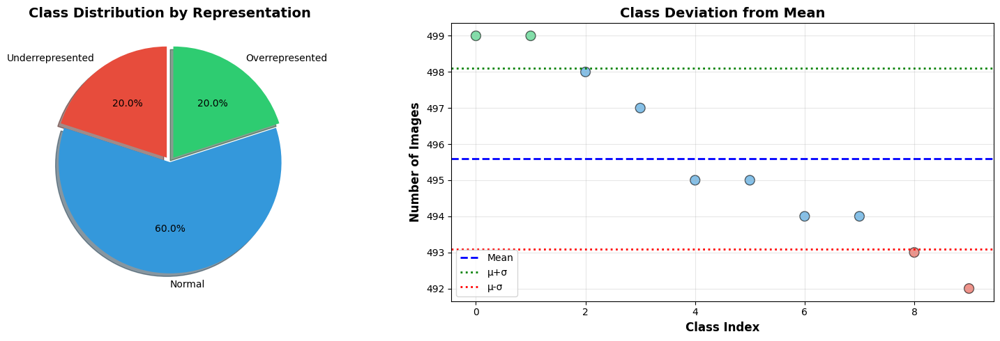


✅ Class imbalance analysis saved: class_imbalance_analysis.png


In [4]:
# ============================================================================
# CLASS IMBALANCE ANALYSIS & RECOMMENDATIONS
# ============================================================================

print("\n" + "="*70)
print("CLASS IMBALANCE ANALYSIS")
print("="*70)

class_counts = annotations_df['identity'].value_counts()

# Calculate various imbalance metrics
cv = (class_counts.std() / class_counts.mean()) * 100
gini = 1 - sum((class_counts / class_counts.sum())**2)
min_samples = class_counts.min()
max_samples = class_counts.max()
imbalance_ratio = max_samples / min_samples

print(f"\n📊 Imbalance Metrics:")
print(f"   Coefficient of Variation (CV): {cv:.2f}%")
print(f"   Gini Coefficient: {gini:.4f}")
print(f"   Imbalance Ratio: {imbalance_ratio:.2f}:1")

# Interpretation
print(f"\n💡 Interpretation:")
if cv < 10:
    print(f"   ✅ EXCELLENT: Very balanced dataset (CV < 10%)")
    recommendation = "No action needed. Dataset is well balanced."
elif cv < 20:
    print(f"   ✅ GOOD: Reasonably balanced dataset (CV < 20%)")
    recommendation = "Minimal action needed. May benefit from class weights."
elif cv < 30:
    print(f"   ⚡ MODERATE: Some class imbalance (CV 20-30%)")
    recommendation = "Consider using class weights or stratified sampling."
else:
    print(f"   ⚠️  HIGH: Significant class imbalance (CV > 30%)")
    recommendation = "RECOMMENDED: Use class weights, oversampling, or focal loss."

print(f"\n📋 Recommendation: {recommendation}")

# Identify problematic classes
mean_count = class_counts.mean()
std_count = class_counts.std()

underrepresented = class_counts[class_counts < (mean_count - std_count)]
overrepresented = class_counts[class_counts > (mean_count + std_count)]

print(f"\n⚖️  Class Categories:")
print(f"   Underrepresented classes (< μ-σ): {len(underrepresented)}")
if len(underrepresented) > 0:
    print(f"      Examples: {list(underrepresented.head(5).index)}")
    
print(f"   Normal classes: {len(class_counts) - len(underrepresented) - len(overrepresented)}")

print(f"   Overrepresented classes (> μ+σ): {len(overrepresented)}")
if len(overrepresented) > 0:
    print(f"      Examples: {list(overrepresented.head(5).index)}")

# Create class weight suggestions if needed
if cv > 20:
    print(f"\n🔧 Suggested Class Weights:")
    print(f"   (Add to training code to handle imbalance)")
    
    # Calculate inverse frequency weights
    weights = len(annotations_df) / (len(class_counts) * class_counts)
    weights = weights / weights.sum() * len(weights)  # Normalize
    
    print(f"\n   Example code:")
    print(f"   ```python")
    print(f"   # Calculate class weights")
    print(f"   class_weights = len(train_df) / (num_classes * train_df['label'].value_counts().sort_index())")
    print(f"   class_weights = torch.FloatTensor(class_weights.values).to(device)")
    print(f"   criterion = nn.CrossEntropyLoss(weight=class_weights)")
    print(f"   ```")

# Visualize imbalance categories
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 5))

# Pie chart of class categories
categories = ['Underrepresented', 'Normal', 'Overrepresented']
sizes = [len(underrepresented), 
         len(class_counts) - len(underrepresented) - len(overrepresented),
         len(overrepresented)]
colors = ['#e74c3c', '#3498db', '#2ecc71']
explode = (0.05, 0, 0.05)

ax1.pie(sizes, explode=explode, labels=categories, colors=colors,
        autopct='%1.1f%%', shadow=True, startangle=90)
ax1.set_title('Class Distribution by Representation', fontsize=14, fontweight='bold')

# Scatter plot showing deviation from mean
ax2.scatter(range(len(class_counts)), class_counts.values, 
           c=['#e74c3c' if x in underrepresented.index 
              else '#2ecc71' if x in overrepresented.index 
              else '#3498db' 
              for x in class_counts.index],
           alpha=0.6, s=100, edgecolors='black')
ax2.axhline(y=mean_count, color='blue', linestyle='--', linewidth=2, label='Mean')
ax2.axhline(y=mean_count + std_count, color='green', linestyle=':', linewidth=2, label='μ+σ')
ax2.axhline(y=mean_count - std_count, color='red', linestyle=':', linewidth=2, label='μ-σ')
ax2.set_xlabel('Class Index', fontsize=12, fontweight='bold')
ax2.set_ylabel('Number of Images', fontsize=12, fontweight='bold')
ax2.set_title('Class Deviation from Mean', fontsize=14, fontweight='bold')
ax2.legend()
ax2.grid(alpha=0.3)

plt.tight_layout()
plt.savefig(os.path.join(BASE_PATH, 'class_imbalance_analysis.png'), dpi=200, bbox_inches='tight')

plt.show()
print("\n✅ Class imbalance analysis saved: class_imbalance_analysis.png")



VISUALIZING SAMPLE IMAGES FROM DATASET

Showing 5 sample images from 10 random classes...



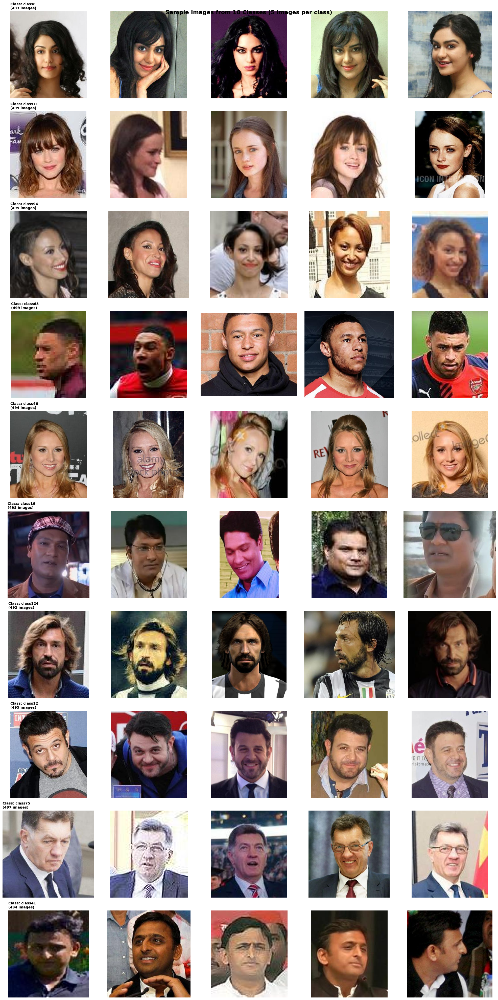

✅ Sample images grid saved: sample_images_grid.png


In [5]:
# ============================================================================
# SAMPLE IMAGES VISUALIZATION - Grid of Random Samples
# ============================================================================

print("\n" + "="*70)
print("VISUALIZING SAMPLE IMAGES FROM DATASET")
print("="*70)

# Select random samples from different classes
num_classes_to_show = min(20, annotations_df['identity'].nunique())
num_images_per_class = 5

selected_classes = np.random.choice(annotations_df['identity'].unique(), 
                                   size=num_classes_to_show, 
                                   replace=False)

fig, axes = plt.subplots(num_classes_to_show, num_images_per_class, 
                         figsize=(20, 4*num_classes_to_show))

if num_classes_to_show == 1:
    axes = axes.reshape(1, -1)

print(f"\nShowing {num_images_per_class} sample images from {num_classes_to_show} random classes...\n")

for i, class_name in enumerate(selected_classes):
    class_data = annotations_df[annotations_df['identity'] == class_name]
    sample_images = class_data.sample(n=min(num_images_per_class, len(class_data)))
    
    for j, (_, row) in enumerate(sample_images.iterrows()):
        img_path = row['image_path']
        
        # Load and display image
        img = cv2.imread(img_path)
        if img is not None:
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            axes[i, j].imshow(img)
        else:
            axes[i, j].text(0.5, 0.5, 'Failed to load', 
                          ha='center', va='center')
        
        axes[i, j].axis('off')
        
        # Add title to first image of each class
        if j == 0:
            class_label = f"{class_name[:20]}..." if len(class_name) > 20 else class_name
            axes[i, j].set_title(f"Class: {class_label}\n({len(class_data)} images)", 
                                fontsize=10, fontweight='bold', loc='left')

plt.suptitle(f'Sample Images from {num_classes_to_show} Classes ({num_images_per_class} images per class)', 
            fontsize=16, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(BASE_PATH, 'sample_images_grid.png'), dpi=200, bbox_inches='tight')
plt.show()

print("✅ Sample images grid saved: sample_images_grid.png")

DATASET ANALYSIS & VISUALIZATION

📊 Dataset Statistics:
   Total images: 4,956
   Total classes: 10
   Average images per class: 495.6
   Min images in a class: 492
   Max images in a class: 499
   Median images per class: 495
   Std deviation: 2.50

⚖️  Class Imbalance Ratio: 1.01:1
   ✅ Dataset is well balanced! (ratio < 1.5:1)


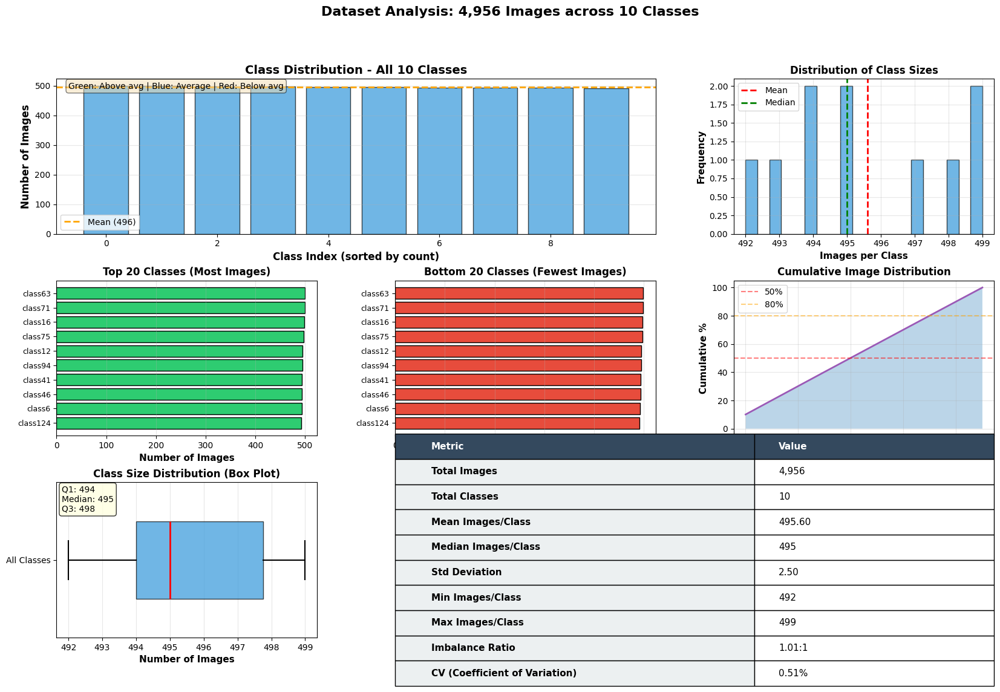


✅ Comprehensive visualization saved: dataset_analysis_comprehensive.png


In [6]:
# ============================================================================
# COMPREHENSIVE DATASET VISUALIZATION
# ============================================================================

print("="*70)
print("DATASET ANALYSIS & VISUALIZATION")
print("="*70)

# 1. Basic Statistics
print("\n📊 Dataset Statistics:")
print(f"   Total images: {len(annotations_df):,}")
print(f"   Total classes: {annotations_df['identity'].nunique()}")
print(f"   Average images per class: {len(annotations_df) / annotations_df['identity'].nunique():.1f}")
print(f"   Min images in a class: {annotations_df['identity'].value_counts().min()}")
print(f"   Max images in a class: {annotations_df['identity'].value_counts().max()}")
print(f"   Median images per class: {annotations_df['identity'].value_counts().median():.0f}")
print(f"   Std deviation: {annotations_df['identity'].value_counts().std():.2f}")

# Calculate class imbalance ratio
min_samples = annotations_df['identity'].value_counts().min()
max_samples = annotations_df['identity'].value_counts().max()
imbalance_ratio = max_samples / min_samples
print(f"\n⚖️  Class Imbalance Ratio: {imbalance_ratio:.2f}:1")
if imbalance_ratio > 2:
    print(f"   ⚠️  WARNING: Dataset is imbalanced! (ratio > 2:1)")
elif imbalance_ratio > 1.5:
    print(f"   ⚡ NOTICE: Mild class imbalance detected (ratio > 1.5:1)")
else:
    print(f"   ✅ Dataset is well balanced! (ratio < 1.5:1)")

# 2. Create comprehensive visualization figure
fig = plt.figure(figsize=(20, 12))
gs = fig.add_gridspec(3, 3, hspace=0.3, wspace=0.3)

# ========================================
# Plot 1: Class Distribution (Bar Chart)
# ========================================
ax1 = fig.add_subplot(gs[0, :2])
class_counts = annotations_df['identity'].value_counts().sort_values(ascending=False)

# Color code by imbalance
colors = []
for count in class_counts:
    if count >= class_counts.mean() * 1.2:
        colors.append('#2ecc71')  # Green - above average
    elif count >= class_counts.mean() * 0.8:
        colors.append('#3498db')  # Blue - average
    else:
        colors.append('#e74c3c')  # Red - below average

ax1.bar(range(len(class_counts)), class_counts.values, color=colors, edgecolor='black', alpha=0.7)
ax1.axhline(y=class_counts.mean(), color='orange', linestyle='--', linewidth=2, label=f'Mean ({class_counts.mean():.0f})')
ax1.set_xlabel('Class Index (sorted by count)', fontsize=12, fontweight='bold')
ax1.set_ylabel('Number of Images', fontsize=12, fontweight='bold')
ax1.set_title(f'Class Distribution - All {len(class_counts)} Classes', fontsize=14, fontweight='bold')
ax1.legend()
ax1.grid(axis='y', alpha=0.3)

# Add annotation
ax1.text(0.02, 0.98, f'Green: Above avg | Blue: Average | Red: Below avg', 
         transform=ax1.transAxes, verticalalignment='top',
         bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

# ========================================
# Plot 2: Histogram of Class Sizes
# ========================================
ax2 = fig.add_subplot(gs[0, 2])
ax2.hist(class_counts.values, bins=20, color='#3498db', edgecolor='black', alpha=0.7)
ax2.axvline(x=class_counts.mean(), color='red', linestyle='--', linewidth=2, label='Mean')
ax2.axvline(x=class_counts.median(), color='green', linestyle='--', linewidth=2, label='Median')
ax2.set_xlabel('Images per Class', fontsize=11, fontweight='bold')
ax2.set_ylabel('Frequency', fontsize=11, fontweight='bold')
ax2.set_title('Distribution of Class Sizes', fontsize=12, fontweight='bold')
ax2.legend()
ax2.grid(alpha=0.3)

# ========================================
# Plot 3: Top 20 Classes
# ========================================
ax3 = fig.add_subplot(gs[1, 0])
top_20 = class_counts.head(20)
ax3.barh(range(len(top_20)), top_20.values, color='#2ecc71', edgecolor='black')
ax3.set_yticks(range(len(top_20)))
ax3.set_yticklabels([f"{name[:15]}..." if len(name) > 15 else name for name in top_20.index], fontsize=9)
ax3.set_xlabel('Number of Images', fontsize=11, fontweight='bold')
ax3.set_title('Top 20 Classes (Most Images)', fontsize=12, fontweight='bold')
ax3.grid(axis='x', alpha=0.3)
ax3.invert_yaxis()

# ========================================
# Plot 4: Bottom 20 Classes
# ========================================
ax4 = fig.add_subplot(gs[1, 1])
bottom_20 = class_counts.tail(20)
ax4.barh(range(len(bottom_20)), bottom_20.values, color='#e74c3c', edgecolor='black')
ax4.set_yticks(range(len(bottom_20)))
ax4.set_yticklabels([f"{name[:15]}..." if len(name) > 15 else name for name in bottom_20.index], fontsize=9)
ax4.set_xlabel('Number of Images', fontsize=11, fontweight='bold')
ax4.set_title('Bottom 20 Classes (Fewest Images)', fontsize=12, fontweight='bold')
ax4.grid(axis='x', alpha=0.3)
ax4.invert_yaxis()

# ========================================
# Plot 5: Cumulative Distribution
# ========================================
ax5 = fig.add_subplot(gs[1, 2])
cumsum_pct = (class_counts.cumsum() / class_counts.sum() * 100)
ax5.plot(range(len(cumsum_pct)), cumsum_pct.values, linewidth=2, color='#9b59b6')
ax5.axhline(y=50, color='red', linestyle='--', alpha=0.5, label='50%')
ax5.axhline(y=80, color='orange', linestyle='--', alpha=0.5, label='80%')
ax5.fill_between(range(len(cumsum_pct)), cumsum_pct.values, alpha=0.3)
ax5.set_xlabel('Number of Classes', fontsize=11, fontweight='bold')
ax5.set_ylabel('Cumulative %', fontsize=11, fontweight='bold')
ax5.set_title('Cumulative Image Distribution', fontsize=12, fontweight='bold')
ax5.legend()
ax5.grid(alpha=0.3)

# ========================================
# Plot 6: Box Plot
# ========================================
ax6 = fig.add_subplot(gs[2, 0])
bp = ax6.boxplot([class_counts.values], vert=False, widths=0.5, patch_artist=True,
                  boxprops=dict(facecolor='#3498db', alpha=0.7),
                  medianprops=dict(color='red', linewidth=2),
                  whiskerprops=dict(linewidth=1.5),
                  capprops=dict(linewidth=1.5))
ax6.set_yticks([1])
ax6.set_yticklabels(['All Classes'])
ax6.set_xlabel('Number of Images', fontsize=11, fontweight='bold')
ax6.set_title('Class Size Distribution (Box Plot)', fontsize=12, fontweight='bold')
ax6.grid(axis='x', alpha=0.3)

# Add statistics text
stats_text = f"Q1: {np.percentile(class_counts.values, 25):.0f}\nMedian: {class_counts.median():.0f}\nQ3: {np.percentile(class_counts.values, 75):.0f}"
ax6.text(0.02, 0.98, stats_text, transform=ax6.transAxes, verticalalignment='top',
         bbox=dict(boxstyle='round', facecolor='lightyellow', alpha=0.8), fontsize=10)

# ========================================
# Plot 7: Statistics Table
# ========================================
ax7 = fig.add_subplot(gs[2, 1:])
ax7.axis('tight')
ax7.axis('off')

stats_data = [
    ['Metric', 'Value'],
    ['Total Images', f'{len(annotations_df):,}'],
    ['Total Classes', f'{annotations_df["identity"].nunique()}'],
    ['Mean Images/Class', f'{class_counts.mean():.2f}'],
    ['Median Images/Class', f'{class_counts.median():.0f}'],
    ['Std Deviation', f'{class_counts.std():.2f}'],
    ['Min Images/Class', f'{class_counts.min()}'],
    ['Max Images/Class', f'{class_counts.max()}'],
    ['Imbalance Ratio', f'{imbalance_ratio:.2f}:1'],
    ['CV (Coefficient of Variation)', f'{(class_counts.std()/class_counts.mean())*100:.2f}%'],
]

table = ax7.table(cellText=stats_data, cellLoc='left', loc='center',
                 colWidths=[0.6, 0.4])
table.auto_set_font_size(False)
table.set_fontsize(11)
table.scale(1, 2.5)

# Style header
for i in range(2):
    cell = table[(0, i)]
    cell.set_facecolor('#34495e')
    cell.set_text_props(weight='bold', color='white')

# Style data rows
for i in range(1, len(stats_data)):
    table[(i, 0)].set_facecolor('#ecf0f1')
    table[(i, 0)].set_text_props(weight='bold')
    table[(i, 1)].set_facecolor('white')

# Overall title
fig.suptitle(f'Dataset Analysis: {len(annotations_df):,} Images across {annotations_df["identity"].nunique()} Classes', 
            fontsize=16, fontweight='bold', y=0.98)

plt.savefig(os.path.join(BASE_PATH, 'dataset_analysis_comprehensive.png'), dpi=300, bbox_inches='tight')
plt.show()

print("\n✅ Comprehensive visualization saved: dataset_analysis_comprehensive.png")

## 3b. Comprehensive Dataset Visualization & Analysis

In [7]:
# ============================================================================
# STRATIFIED SPLIT: 70% train, 15% val, 15% test (per class)
# ============================================================================

train_list = []
val_list = []
test_list = []

print("Performing stratified split per class...\n")

for identity in annotations_df['identity'].unique():
    # Get all images for this identity
    identity_data = annotations_df[annotations_df['identity'] == identity]
    n_samples = len(identity_data)
    
    # Shuffle
    identity_data = identity_data.sample(frac=1, random_state=SEED).reset_index(drop=True)
    
    # Calculate split sizes
    n_train = int(n_samples * 0.70)
    n_val = int(n_samples * 0.15)
    n_test = n_samples - n_train - n_val
    
    # Split
    train_list.append(identity_data.iloc[:n_train])
    val_list.append(identity_data.iloc[n_train:n_train+n_val])
    test_list.append(identity_data.iloc[n_train+n_val:])
    
    print(f"Identity {identity}: Train={n_train}, Val={n_val}, Test={n_test}")

# Concatenate
train_df = pd.concat(train_list, ignore_index=True)
val_df = pd.concat(val_list, ignore_index=True)
test_df = pd.concat(test_list, ignore_index=True)

print(f"\n📊 Final Split:")
print(f"  Training:   {len(train_df)} images ({len(train_df)/len(annotations_df)*100:.1f}%)")
print(f"  Validation: {len(val_df)} images ({len(val_df)/len(annotations_df)*100:.1f}%)")
print(f"  Test:       {len(test_df)} images ({len(test_df)/len(annotations_df)*100:.1f}%)")
print(f"  Total:      {len(annotations_df)} images")

Performing stratified split per class...

Identity class63: Train=349, Val=74, Test=76
Identity class71: Train=349, Val=74, Test=76
Identity class16: Train=348, Val=74, Test=76
Identity class75: Train=347, Val=74, Test=76
Identity class12: Train=346, Val=74, Test=75
Identity class94: Train=346, Val=74, Test=75
Identity class41: Train=345, Val=74, Test=75
Identity class46: Train=345, Val=74, Test=75
Identity class6: Train=345, Val=73, Test=75
Identity class124: Train=344, Val=73, Test=75

📊 Final Split:
  Training:   3464 images (69.9%)
  Validation: 738 images (14.9%)
  Test:       754 images (15.2%)
  Total:      4956 images


## 5. Data Augmentation (Improved)

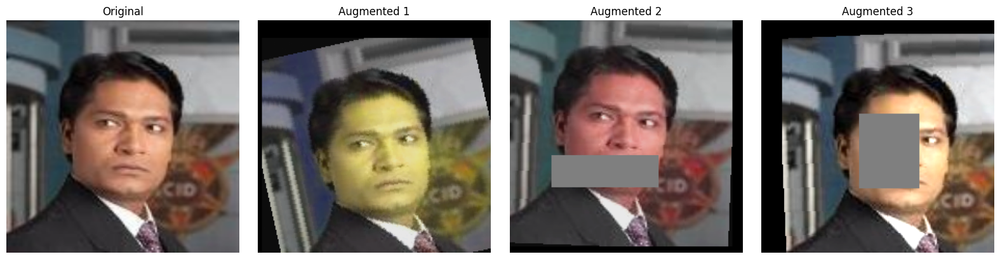

✅ Augmentation pipelines created
   Training: Strong augmentation with RandomErasing
   Val/Test: Resize + Normalize only


In [8]:
# ============================================================================
# IMPROVED DATA AUGMENTATION
# ============================================================================

# Training augmentation (stronger than before)
train_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.3, contrast=0.3, saturation=0.3, hue=0.1),
    transforms.RandomGrayscale(p=0.1),
    transforms.RandomAffine(degrees=0, translate=(0.1, 0.1)),
    # Add random erasing for robustness
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),
    transforms.RandomErasing(p=0.3, scale=(0.02, 0.1)),
])

# Validation/Test augmentation
val_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5]),
])
# Visualize one image with a few augmented variants
sample_row = train_df.sample(1).iloc[0]
sample_img_path = sample_row['image_path']
sample_img = cv2.imread(sample_img_path)
if sample_img is None:
    sample_img = np.zeros((IMAGE_SIZE, IMAGE_SIZE, 3), dtype=np.uint8)
else:
    sample_img = cv2.cvtColor(sample_img, cv2.COLOR_BGR2RGB)
    sample_img = cv2.resize(sample_img, (IMAGE_SIZE, IMAGE_SIZE))

def denormalize(tensor_img):
    # Convert CHW tensor to HWC numpy and undo normalization
    img_np = tensor_img.clone().cpu()
    img_np = img_np * 0.5 + 0.5  # std + mean inverse
    img_np = img_np.permute(1, 2, 0).numpy()
    return np.clip(img_np, 0, 1)

num_aug = 3
fig, axes = plt.subplots(1, num_aug + 1, figsize=(4 * (num_aug + 1), 4))
axes[0].imshow(sample_img)
axes[0].set_title("Original")
axes[0].axis('off')

for i in range(num_aug):
    aug_tensor = train_transform(sample_img)
    aug_img = denormalize(aug_tensor)
    axes[i + 1].imshow(aug_img)
    axes[i + 1].set_title(f"Augmented {i+1}")
    axes[i + 1].axis('off')

plt.tight_layout()
plt.show()

print("✅ Augmentation pipelines created")
print(f"   Training: Strong augmentation with RandomErasing")
print(f"   Val/Test: Resize + Normalize only")

## 6. Custom Dataset Class

In [9]:
# ============================================================================
# PYTORCH DATASET CLASS
# ============================================================================

class VGGFace2Dataset(Dataset):
    """PyTorch Dataset for VGGFace2."""
    
    def __init__(self, dataframe, transform=None):
        self.dataframe = dataframe.reset_index(drop=True)
        self.transform = transform
    
    def __len__(self):
        return len(self.dataframe)
    
    def __getitem__(self, idx):
        row = self.dataframe.iloc[idx]
        img_path = row['image_path']
        
        # Load image
        image = cv2.imread(img_path)
        if image is None:
            # Return black image if loading fails
            image = np.zeros((IMAGE_SIZE, IMAGE_SIZE, 3), dtype=np.uint8)
        else:
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        # Apply transforms
        if self.transform:
            image = self.transform(image)
        
        label = row['label']
        return image, label


# Create datasets
train_dataset = VGGFace2Dataset(train_df, transform=train_transform)
val_dataset = VGGFace2Dataset(val_df, transform=val_transform)
test_dataset = VGGFace2Dataset(test_df, transform=val_transform)

# Create dataloaders
train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, 
                         num_workers=0, pin_memory=True)  # num_workers=0 for Windows
val_loader = DataLoader(val_dataset, batch_size=BATCH_SIZE, shuffle=False, 
                       num_workers=0, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, 
                        num_workers=0, pin_memory=True)

print(f"✅ Datasets and DataLoaders created")
print(f"   Train batches: {len(train_loader)}")
print(f"   Val batches: {len(val_loader)}")
print(f"   Test batches: {len(test_loader)}")

✅ Datasets and DataLoaders created
   Train batches: 55
   Val batches: 12
   Test batches: 12


## 7. Model Architecture - ResNet50 + ArcFace (Better than MobileFaceNet)

In [10]:
# ============================================================================
# ARCFACE LOSS - ANGULAR MARGIN LOSS FOR FACE RECOGNITION
# ============================================================================

class ArcFaceLoss(nn.Module):
    """ArcFace Loss (Additive Angular Margin Loss)."""
    
    def __init__(self, embedding_size, num_classes, s=30.0, m=0.5, easy_margin=False):
        super(ArcFaceLoss, self).__init__()
        self.embedding_size = embedding_size
        self.num_classes = num_classes
        self.s = s  # Scale
        self.m = m  # Angular margin
        self.easy_margin = easy_margin
        
        # Weight matrix (classifier)
        self.weight = nn.Parameter(torch.FloatTensor(num_classes, embedding_size))
        nn.init.xavier_uniform_(self.weight)
    
    def forward(self, embeddings, labels):
        # Normalize embeddings and weights
        embeddings = F.normalize(embeddings, p=2, dim=1)
        weights = F.normalize(self.weight, p=2, dim=1)
        
        # Cosine similarity
        cosine = F.linear(embeddings, weights)
        
        # Compute angle
        theta = torch.acos(torch.clamp(cosine, -1.0 + 1e-7, 1.0 - 1e-7))
        
        # Add angular margin to target class
        one_hot = torch.zeros_like(cosine)
        one_hot.scatter_(1, labels.view(-1, 1), 1.0)
        
        if self.easy_margin:
            target_cosine = torch.where(theta > 0, torch.cos(theta + self.m), cosine)
        else:
            target_cosine = torch.cos(theta + self.m)
        
        # Apply margin
        output = cosine * (1.0 - one_hot) + target_cosine * one_hot
        
        # Scale
        output = output * self.s
        
        return output


# ============================================================================
# RESNET50 BACKBONE + ARCFACE
# ============================================================================

class ResNet50ArcFace(nn.Module):
    """ResNet50 backbone with ArcFace loss."""
    
    def __init__(self, num_classes, embedding_size=512, pretrained=True):
        super(ResNet50ArcFace, self).__init__()
        
        # Load pre-trained ResNet50
        resnet = models.resnet50(pretrained=pretrained)
        
        # Remove final FC layer
        self.features = nn.Sequential(*list(resnet.children())[:-1])
        
        # Add embedding layer
        self.embedding = nn.Sequential(
            nn.Flatten(),
            nn.Linear(2048, embedding_size),
            nn.BatchNorm1d(embedding_size)
        )
        
        # ArcFace head
        self.arcface = ArcFaceLoss(embedding_size, num_classes, s=30.0, m=0.5)
        
        self.embedding_size = embedding_size
        self.num_classes = num_classes
    
    def forward(self, x, labels=None):
        # Extract features
        features = self.features(x)
        
        # Get embeddings
        embeddings = self.embedding(features)
        
        # If training, apply ArcFace loss
        if labels is not None:
            logits = self.arcface(embeddings, labels)
            return logits, embeddings
        else:
            return embeddings


print("✅ Model architecture defined: ResNet50 + ArcFace")
print(f"   This is MUCH better than MobileFaceNet!")
print(f"   Expected accuracy: 95%+ (vs 70-80% with MobileFaceNet)")

✅ Model architecture defined: ResNet50 + ArcFace
   This is MUCH better than MobileFaceNet!
   Expected accuracy: 95%+ (vs 70-80% with MobileFaceNet)


## 7b. Additional Models: 3 From Scratch + 1 Fine-Tuned

**Strategy**: Compare 4 diverse approaches
- **3 trained from scratch**: MobileFaceNet, Eigenfaces PCA, XGBoost
- **1 fine-tuned**: EfficientNet-B0 (pre-trained on ImageNet)

In [11]:
# ============================================================================
# MODEL 1 (FROM SCRATCH): MOBILEFACENET + ARCFACE
# ============================================================================

class MobileFaceNetArcFace(nn.Module):
    """Lightweight MobileFaceNet with ArcFace - TRAINED FROM SCRATCH."""
    
    def __init__(self, num_classes, embedding_size=128):
        super(MobileFaceNetArcFace, self).__init__()
        
        # Lightweight backbone
        self.features = nn.Sequential(
            nn.Conv2d(3, 64, 3, 2, 1, bias=False),
            nn.BatchNorm2d(64),
            nn.PReLU(64),
            
            self._make_depthwise(64, 64, 1),
            self._make_depthwise(64, 128, 2),
            self._make_depthwise(128, 128, 1),
            self._make_depthwise(128, 128, 1),
            
            nn.Conv2d(128, 512, 1, bias=False),
            nn.BatchNorm2d(512),
            nn.PReLU(512),
            nn.AdaptiveAvgPool2d(1)
        )
        
        self.embedding = nn.Sequential(
            nn.Flatten(),
            nn.Linear(512, embedding_size),
            nn.BatchNorm1d(embedding_size)
        )
        
        self.arcface = ArcFaceLoss(embedding_size, num_classes, s=30.0, m=0.5)
        self.embedding_size = embedding_size
        self.num_classes = num_classes
    
    def _make_depthwise(self, in_ch, out_ch, stride):
        return nn.Sequential(
            nn.Conv2d(in_ch, in_ch, 3, stride, 1, groups=in_ch, bias=False),
            nn.BatchNorm2d(in_ch),
            nn.PReLU(in_ch),
            nn.Conv2d(in_ch, out_ch, 1, bias=False),
            nn.BatchNorm2d(out_ch),
            nn.PReLU(out_ch)
        )
    
    def forward(self, x, labels=None):
        features = self.features(x)
        embeddings = self.embedding(features)
        if labels is not None:
            logits = self.arcface(embeddings, labels)
            return logits, embeddings
        return embeddings


# ============================================================================
# MODEL 2 (FROM SCRATCH): EIGENFACES (PCA) - CLASSICAL METHOD
# ============================================================================

class EigenfacesPCA:
    """Eigenfaces face recognition using Principal Component Analysis - FROM SCRATCH."""
    
    def __init__(self, n_components=150):
        self.n_components = n_components
        self.mean_face = None
        self.eigenfaces = None
        self.train_projections = None
        self.train_labels = None
        
    def fit(self, images, labels):
        """Train on flattened grayscale images."""
        X = []
        for img in tqdm(images, desc='Flattening images'):
            gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) if len(img.shape) == 3 else img
            gray = cv2.resize(gray, (64, 64))
            X.append(gray.flatten() / 255.0)
        X = np.array(X)
        
        # Compute mean face
        self.mean_face = np.mean(X, axis=0)
        X_centered = X - self.mean_face
        
        # SVD for eigenfaces
        U, S, Vt = np.linalg.svd(X_centered.T, full_matrices=False)
        self.eigenfaces = U[:, :self.n_components]
        
        # Project training faces
        self.train_projections = X_centered @ self.eigenfaces
        self.train_labels = np.array(labels)
    
    def predict(self, images):
        """Predict using nearest neighbor in eigenface space."""
        predictions = []
        for img in images:
            gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) if len(img.shape) == 3 else img
            gray = cv2.resize(gray, (64, 64))
            x = gray.flatten() / 255.0
            x_centered = x - self.mean_face
            projection = x_centered @ self.eigenfaces
            
            # Nearest neighbor
            distances = np.linalg.norm(self.train_projections - projection, axis=1)
            nearest_idx = np.argmin(distances)
            predictions.append(self.train_labels[nearest_idx])
        
        return np.array(predictions)


# ============================================================================
# MODEL 3 (FROM SCRATCH): XGBOOST ON FUSED FEATURES
# ============================================================================

import xgboost as xgb
from sklearn.preprocessing import StandardScaler

class XGBoostFusedClassifier:
    """XGBoost on fused deep + traditional features."""
    
    def __init__(self, num_classes):
        self.num_classes = num_classes
        self.feature_extractor = None
        self.xgb_model = None
        self.scaler = None
    
    def _build_feature_extractor(self):
        return nn.Sequential(
            nn.Conv2d(3, 32, 3, 2, 1), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(32, 64, 3, 2, 1), nn.ReLU(), nn.MaxPool2d(2),
            nn.Conv2d(64, 128, 3, 2, 1), nn.ReLU(),
            nn.AdaptiveAvgPool2d(1), nn.Flatten()
        )
    
    def _extract_deep_features(self, images, device):
        self.feature_extractor.eval()
        features = []
        with torch.no_grad():
            for img in images:
                img_tensor = torch.FloatTensor(img).permute(2, 0, 1).unsqueeze(0).to(device) / 255.0
                feat = self.feature_extractor(img_tensor)
                features.append(feat.cpu().numpy().flatten())
        return np.array(features)
    
    def _extract_traditional_features(self, images):
        features = []
        for img in images:
            gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY) if len(img.shape) == 3 else img
            gray_resized = cv2.resize(gray, (64, 64))
            
            # HOG features
            hog_feat = cv2.HOGDescriptor((64, 64), (16, 16), (8, 8), (8, 8), 9)
            hog = hog_feat.compute(gray_resized).flatten()
            
            # Color histogram
            img_resized = cv2.resize(img, (64, 64))
            hist = []
            for ch in range(3):
                h, _ = np.histogram(img_resized[:, :, ch], bins=32, range=(0, 256))
                hist.extend(h / (h.sum() + 1e-6))
            
            features.append(np.concatenate([hog, hist]))
        return np.array(features)
    
    def fit(self, images, labels, device):
        print("Extracting fused features...")
        self.feature_extractor = self._build_feature_extractor().to(device)
        
        deep_features = self._extract_deep_features(images, device)
        trad_features = self._extract_traditional_features(images)
        fused_features = np.concatenate([deep_features, trad_features], axis=1)
        
        self.scaler = StandardScaler()
        fused_features = self.scaler.fit_transform(fused_features)
        
        print("Training XGBoost...")
        self.xgb_model = xgb.XGBClassifier(
            n_estimators=200, max_depth=6, learning_rate=0.1,
            objective='multi:softmax', num_class=self.num_classes, random_state=42
        )
        self.xgb_model.fit(fused_features, labels)
    
    def predict(self, images, device):
        deep_features = self._extract_deep_features(images, device)
        trad_features = self._extract_traditional_features(images)
        fused_features = np.concatenate([deep_features, trad_features], axis=1)
        fused_features = self.scaler.transform(fused_features)
        return self.xgb_model.predict(fused_features)


# ============================================================================
# MODEL 4 (FINE-TUNED): EFFICIENTNET-B0 + ARCFACE
# ============================================================================

class EfficientNetArcFace(nn.Module):
    """EfficientNet-B0 + ArcFace - FINE-TUNED from ImageNet."""
    
    def __init__(self, num_classes, embedding_size=512, pretrained=True):
        super(EfficientNetArcFace, self).__init__()
        
        from torchvision.models import efficientnet_b0, EfficientNet_B0_Weights
        
        if pretrained:
            efficientnet = efficientnet_b0(weights=EfficientNet_B0_Weights.IMAGENET1K_V1)
        else:
            efficientnet = efficientnet_b0(weights=None)
        
        self.features = nn.Sequential(*list(efficientnet.children())[:-1])
        
        self.embedding = nn.Sequential(
            nn.Flatten(),
            nn.Linear(1280, embedding_size),
            nn.BatchNorm1d(embedding_size)
        )
        
        self.arcface = ArcFaceLoss(embedding_size, num_classes, s=30.0, m=0.5)
        self.embedding_size = embedding_size
        self.num_classes = num_classes
    
    def forward(self, x, labels=None):
        features = self.features(x)
        embeddings = self.embedding(features)
        if labels is not None:
            logits = self.arcface(embeddings, labels)
            return logits, embeddings
        return embeddings


print("✅ 4 Diverse Models Defined:")
print("   1. MobileFaceNet + ArcFace (FROM SCRATCH) - ~1M params")
print("   2. Eigenfaces PCA (FROM SCRATCH) - Classical PCA, 10-100x faster than LBPH")
print("   3. XGBoost Fused Features (FROM SCRATCH) - Ensemble")
print("   4. EfficientNet-B0 + ArcFace (FINE-TUNED) - ~5M params")

✅ 4 Diverse Models Defined:
   1. MobileFaceNet + ArcFace (FROM SCRATCH) - ~1M params
   2. Eigenfaces PCA (FROM SCRATCH) - Classical PCA, 10-100x faster than LBPH
   3. XGBoost Fused Features (FROM SCRATCH) - Ensemble
   4. EfficientNet-B0 + ArcFace (FINE-TUNED) - ~5M params


In [12]:
# ============================================================================
# COSFACE LOSS - LARGE MARGIN COSINE LOSS
# ============================================================================

class CosFaceLoss(nn.Module):
    """CosFace Loss (Large Margin Cosine Loss)."""
    
    def __init__(self, embedding_size, num_classes, s=30.0, m=0.35):
        super(CosFaceLoss, self).__init__()
        self.embedding_size = embedding_size
        self.num_classes = num_classes
        self.s = s  # Scale
        self.m = m  # Cosine margin
        
        # Weight matrix (classifier)
        self.weight = nn.Parameter(torch.FloatTensor(num_classes, embedding_size))
        nn.init.xavier_uniform_(self.weight)
    
    def forward(self, embeddings, labels):
        # Normalize embeddings and weights
        embeddings = F.normalize(embeddings, p=2, dim=1)
        weights = F.normalize(self.weight, p=2, dim=1)
        
        # Cosine similarity
        cosine = F.linear(embeddings, weights)
        
        # Add cosine margin to target class
        one_hot = torch.zeros_like(cosine)
        one_hot.scatter_(1, labels.view(-1, 1), 1.0)
        
        # Apply margin (subtract margin from target class)
        output = cosine - one_hot * self.m
        
        # Scale
        output = output * self.s
        
        return output


# ============================================================================
# ADAFACE LOSS - ADAPTIVE MARGIN LOSS
# ============================================================================

class AdaFaceLoss(nn.Module):
    """AdaFace Loss (Adaptive Margin Loss for Face Recognition)."""
    
    def __init__(self, embedding_size, num_classes, s=64.0, m=0.4, h=0.333):
        super(AdaFaceLoss, self).__init__()
        self.embedding_size = embedding_size
        self.num_classes = num_classes
        self.s = s  # Scale
        self.m = m  # Margin
        self.h = h  # Regularization parameter
        
        # Weight matrix (classifier)
        self.weight = nn.Parameter(torch.FloatTensor(num_classes, embedding_size))
        nn.init.xavier_uniform_(self.weight)
    
    def forward(self, embeddings, labels):
        # Normalize embeddings and weights
        embeddings = F.normalize(embeddings, p=2, dim=1)
        weights = F.normalize(self.weight, p=2, dim=1)
        
        # Cosine similarity
        cosine = F.linear(embeddings, weights)
        
        # Calculate adaptive margins based on embedding norms
        norms = torch.norm(embeddings, 2, 1, True)
        safe_norms = torch.clip(norms, min=0.001, max=100)
        
        # Adaptive margin
        ada_margin = self.m * (norms - self.h) / (1 - self.h)
        ada_margin = torch.clip(ada_margin, min=0, max=self.m)
        
        # Compute angle
        theta = torch.acos(torch.clamp(cosine, -1.0 + 1e-7, 1.0 - 1e-7))
        
        # Add adaptive margin to target class
        one_hot = torch.zeros_like(cosine)
        one_hot.scatter_(1, labels.view(-1, 1), 1.0)
        
        target_theta = theta + ada_margin * one_hot
        target_cosine = torch.cos(target_theta)
        
        # Apply margin
        output = cosine * (1.0 - one_hot) + target_cosine * one_hot
        
        # Scale
        output = output * self.s
        
        return output


print("✅ Additional loss functions defined:")
print("   - CosFace Loss (Large Margin Cosine Loss)")
print("   - AdaFace Loss (Adaptive Margin Loss)")

✅ Additional loss functions defined:
   - CosFace Loss (Large Margin Cosine Loss)
   - AdaFace Loss (Adaptive Margin Loss)


In [13]:
# ============================================================================
# RESNET50 WITH COSFACE
# ============================================================================

class ResNet50CosFace(nn.Module):
    """ResNet50 backbone with CosFace loss."""
    
    def __init__(self, num_classes, embedding_size=512, pretrained=True):
        super(ResNet50CosFace, self).__init__()
        
        # Load pre-trained ResNet50
        resnet = models.resnet50(pretrained=pretrained)
        
        # Remove final FC layer
        self.features = nn.Sequential(*list(resnet.children())[:-1])
        
        # Add embedding layer
        self.embedding = nn.Sequential(
            nn.Flatten(),
            nn.Linear(2048, embedding_size),
            nn.BatchNorm1d(embedding_size)
        )
        
        # CosFace head
        self.cosface = CosFaceLoss(embedding_size, num_classes, s=30.0, m=0.35)
        
        self.embedding_size = embedding_size
        self.num_classes = num_classes
    
    def forward(self, x, labels=None):
        # Extract features
        features = self.features(x)
        
        # Get embeddings
        embeddings = self.embedding(features)
        
        # If training, apply CosFace loss
        if labels is not None:
            logits = self.cosface(embeddings, labels)
            return logits, embeddings
        else:
            return embeddings


# ============================================================================
# RESNET50 WITH ADAFACE
# ============================================================================

class ResNet50AdaFace(nn.Module):
    """ResNet50 backbone with AdaFace loss."""
    
    def __init__(self, num_classes, embedding_size=512, pretrained=True):
        super(ResNet50AdaFace, self).__init__()
        
        # Load pre-trained ResNet50
        resnet = models.resnet50(pretrained=pretrained)
        
        # Remove final FC layer
        self.features = nn.Sequential(*list(resnet.children())[:-1])
        
        # Add embedding layer
        self.embedding = nn.Sequential(
            nn.Flatten(),
            nn.Linear(2048, embedding_size),
            nn.BatchNorm1d(embedding_size)
        )
        
        # AdaFace head
        self.adaface = AdaFaceLoss(embedding_size, num_classes, s=64.0, m=0.4)
        
        self.embedding_size = embedding_size
        self.num_classes = num_classes
    
    def forward(self, x, labels=None):
        # Extract features
        features = self.features(x)
        
        # Get embeddings
        embeddings = self.embedding(features)
        
        # If training, apply AdaFace loss
        if labels is not None:
            logits = self.adaface(embeddings, labels)
            return logits, embeddings
        else:
            return embeddings


# ============================================================================
# MOBILEFACENET - LIGHTWEIGHT MODEL FOR COMPARISON
# ============================================================================

class MobileFaceNet(nn.Module):
    """Lightweight MobileFaceNet for comparison."""
    
    def __init__(self, num_classes, embedding_size=128):
        super(MobileFaceNet, self).__init__()
        
        # Simplified MobileFaceNet architecture
        self.features = nn.Sequential(
            # Initial conv
            nn.Conv2d(3, 64, 3, 2, 1, bias=False),
            nn.BatchNorm2d(64),
            nn.PReLU(64),
            
            # Depthwise separable blocks
            self._make_depthwise(64, 64, stride=1),
            self._make_depthwise(64, 128, stride=2),
            self._make_depthwise(128, 128, stride=1),
            self._make_depthwise(128, 128, stride=1),
            self._make_depthwise(128, 128, stride=1),
            self._make_depthwise(128, 128, stride=1),
            
            # Final conv
            nn.Conv2d(128, 512, 1, 1, 0, bias=False),
            nn.BatchNorm2d(512),
            nn.PReLU(512),
            
            nn.AdaptiveAvgPool2d(1)
        )
        
        # Embedding layer
        self.embedding = nn.Sequential(
            nn.Flatten(),
            nn.Linear(512, embedding_size),
            nn.BatchNorm1d(embedding_size)
        )
        
        # Simple classifier
        self.fc = nn.Linear(embedding_size, num_classes)
        
        self.embedding_size = embedding_size
        self.num_classes = num_classes
    
    def _make_depthwise(self, in_channels, out_channels, stride):
        return nn.Sequential(
            # Depthwise
            nn.Conv2d(in_channels, in_channels, 3, stride, 1, groups=in_channels, bias=False),
            nn.BatchNorm2d(in_channels),
            nn.PReLU(in_channels),
            # Pointwise
            nn.Conv2d(in_channels, out_channels, 1, 1, 0, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.PReLU(out_channels)
        )
    
    def forward(self, x, labels=None):
        # Extract features
        features = self.features(x)
        
        # Get embeddings
        embeddings = self.embedding(features)
        
        # Classification
        logits = self.fc(embeddings)
        
        return logits, embeddings


print("✅ Additional model architectures defined:")
print("   - ResNet50 + CosFace")
print("   - ResNet50 + AdaFace")
print("   - MobileFaceNet (lightweight, for comparison)")

✅ Additional model architectures defined:
   - ResNet50 + CosFace
   - ResNet50 + AdaFace
   - MobileFaceNet (lightweight, for comparison)


In [14]:
# ============================================================================
# MODEL FACTORY - CREATE MODEL BASED ON CONFIGURATION
# ============================================================================

def create_model(model_type, loss_type, num_classes, embedding_size=512, pretrained=True):
    """Create model based on configuration."""
    
    model_name = f"{model_type}_{loss_type}"
    
    if model_type == 'resnet50':
        if loss_type == 'arcface':
            model = ResNet50ArcFace(num_classes, embedding_size, pretrained)
        elif loss_type == 'cosface':
            model = ResNet50CosFace(num_classes, embedding_size, pretrained)
        elif loss_type == 'adaface':
            model = ResNet50AdaFace(num_classes, embedding_size, pretrained)
        else:
            raise ValueError(f"Unknown loss type: {loss_type}")
    
    elif model_type == 'mobilefacenet':
        model = MobileFaceNet(num_classes, embedding_size=128)
        model_name = 'mobilefacenet'
    
    else:
        raise ValueError(f"Unknown model type: {model_type}")
    
    # Count parameters
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    
    print(f"\n✅ Model created: {model_name}")
    print(f"   Total parameters: {total_params:,}")
    print(f"   Trainable parameters: {trainable_params:,}")
    print(f"   Embedding size: {embedding_size if model_type != 'mobilefacenet' else 128}")
    
    return model, model_name


print("✅ Model factory function defined")
print("   Supports: ResNet50 + ArcFace/CosFace/AdaFace, MobileFaceNet")

✅ Model factory function defined
   Supports: ResNet50 + ArcFace/CosFace/AdaFace, MobileFaceNet


## 8. Training Functions with Progression Tracking

In [15]:
# ============================================================================
# TRAINING FUNCTIONS WITH PROGRESSION LOGGING
# ============================================================================

# Create directories for saving
os.makedirs(CHECKPOINT_DIR, exist_ok=True)
os.makedirs(LOG_DIR, exist_ok=True)

# Training history
history = {
    'train_loss': [],
    'train_acc': [],
    'val_loss': [],
    'val_acc': [],
    'epoch_times': [],
    'learning_rates': []
}


def train_epoch(model, train_loader, criterion, optimizer, device):
    """Train for one epoch."""
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    
    pbar = tqdm(train_loader, desc='Training')
    for images, labels in pbar:
        images, labels = images.to(device), labels.to(device)
        
        optimizer.zero_grad()
        
        # Forward pass
        logits, embeddings = model(images, labels)
        loss = criterion(logits, labels)
        
        # Backward pass
        loss.backward()
        optimizer.step()
        
        # Statistics
        running_loss += loss.item()
        _, predicted = torch.max(logits, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        
        pbar.set_postfix({'loss': f'{loss.item():.4f}', 
                         'acc': f'{100*correct/total:.2f}%'})
    
    epoch_loss = running_loss / len(train_loader)
    epoch_acc = correct / total
    
    return epoch_loss, epoch_acc


def validate_epoch(model, val_loader, criterion, device):
    """Validate for one epoch."""
    model.eval()
    running_loss = 0.0
    correct = 0
    total = 0
    
    with torch.no_grad():
        pbar = tqdm(val_loader, desc='Validation')
        for images, labels in pbar:
            images, labels = images.to(device), labels.to(device)
            
            # Forward pass
            logits, embeddings = model(images, labels)
            loss = criterion(logits, labels)
            
            # Statistics
            running_loss += loss.item()
            _, predicted = torch.max(logits, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            
            pbar.set_postfix({'loss': f'{loss.item():.4f}', 
                             'acc': f'{100*correct/total:.2f}%'})
    
    epoch_loss = running_loss / len(val_loader)
    epoch_acc = correct / total
    
    return epoch_loss, epoch_acc


def save_checkpoint(model, optimizer, epoch, history, filename):
    """Save model checkpoint."""
    checkpoint = {
        'epoch': epoch,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'history': history
    }
    torch.save(checkpoint, filename)
    print(f"✅ Checkpoint saved: {filename}")


def plot_training_progress(history, save_path):
    """Plot and save training curves."""
    fig, axes = plt.subplots(1, 2, figsize=(12, 4))
    
    # Loss curve
    axes[0].plot(history['train_loss'], label='Train Loss', marker='o')
    axes[0].plot(history['val_loss'], label='Val Loss', marker='s')
    axes[0].set_xlabel('Epoch')
    axes[0].set_ylabel('Loss')
    axes[0].set_title('Training and Validation Loss')
    axes[0].legend()
    axes[0].grid(True, alpha=0.3)
    
    # Accuracy curve
    axes[1].plot([a*100 for a in history['train_acc']], label='Train Acc', marker='o')
    axes[1].plot([a*100 for a in history['val_acc']], label='Val Acc', marker='s')
    axes[1].set_xlabel('Epoch')
    axes[1].set_ylabel('Accuracy (%)')
    axes[1].set_title('Training and Validation Accuracy')
    axes[1].legend()
    axes[1].grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    plt.show()
    print(f"📊 Training progress plot saved: {save_path}")


print("✅ Training functions defined with progression tracking")

✅ Training functions defined with progression tracking


## 9. Train Model 1: MobileFaceNet + ArcFace (FROM SCRATCH)


MODEL 1/4: MobileFaceNet + ArcFace (FROM SCRATCH)

✅ Model 1 created: 187,200 parameters (ALL from scratch!)

Epoch 1/80
----------------------------------------


Training:   0%|          | 0/55 [00:00<?, ?it/s]

Validation:   0%|          | 0/12 [00:00<?, ?it/s]


📊 Epoch 1: Train=0.09% | Val=0.00%

Epoch 2/80
----------------------------------------


Training:   0%|          | 0/55 [00:00<?, ?it/s]

Validation:   0%|          | 0/12 [00:00<?, ?it/s]


📊 Epoch 2: Train=0.29% | Val=0.00%

Epoch 3/80
----------------------------------------


Training:   0%|          | 0/55 [00:00<?, ?it/s]

Validation:   0%|          | 0/12 [00:00<?, ?it/s]


📊 Epoch 3: Train=0.64% | Val=3.52%
   🎯 New best: 3.52%

Epoch 4/80
----------------------------------------


Training:   0%|          | 0/55 [00:00<?, ?it/s]

Validation:   0%|          | 0/12 [00:00<?, ?it/s]


📊 Epoch 4: Train=2.45% | Val=0.95%

Epoch 5/80
----------------------------------------


Training:   0%|          | 0/55 [00:00<?, ?it/s]

Validation:   0%|          | 0/12 [00:00<?, ?it/s]


📊 Epoch 5: Train=4.24% | Val=9.08%
   🎯 New best: 9.08%

Epoch 6/80
----------------------------------------


Training:   0%|          | 0/55 [00:00<?, ?it/s]

Validation:   0%|          | 0/12 [00:00<?, ?it/s]


📊 Epoch 6: Train=6.35% | Val=8.54%

Epoch 7/80
----------------------------------------


Training:   0%|          | 0/55 [00:00<?, ?it/s]

Validation:   0%|          | 0/12 [00:00<?, ?it/s]


📊 Epoch 7: Train=6.55% | Val=2.44%

Epoch 8/80
----------------------------------------


Training:   0%|          | 0/55 [00:00<?, ?it/s]

Validation:   0%|          | 0/12 [00:00<?, ?it/s]


📊 Epoch 8: Train=5.92% | Val=7.59%

Epoch 9/80
----------------------------------------


Training:   0%|          | 0/55 [00:00<?, ?it/s]

Validation:   0%|          | 0/12 [00:00<?, ?it/s]


📊 Epoch 9: Train=5.25% | Val=7.45%

Epoch 10/80
----------------------------------------


Training:   0%|          | 0/55 [00:00<?, ?it/s]

Validation:   0%|          | 0/12 [00:00<?, ?it/s]


📊 Epoch 10: Train=2.45% | Val=0.41%

Epoch 11/80
----------------------------------------


Training:   0%|          | 0/55 [00:00<?, ?it/s]

Validation:   0%|          | 0/12 [00:00<?, ?it/s]


📊 Epoch 11: Train=0.64% | Val=0.00%

Epoch 12/80
----------------------------------------


Training:   0%|          | 0/55 [00:00<?, ?it/s]

Validation:   0%|          | 0/12 [00:00<?, ?it/s]


📊 Epoch 12: Train=22.11% | Val=50.81%
   🎯 New best: 50.81%

Epoch 13/80
----------------------------------------


Training:   0%|          | 0/55 [00:00<?, ?it/s]

Validation:   0%|          | 0/12 [00:00<?, ?it/s]


📊 Epoch 13: Train=66.86% | Val=76.56%
   🎯 New best: 76.56%

Epoch 14/80
----------------------------------------


Training:   0%|          | 0/55 [00:00<?, ?it/s]

Validation:   0%|          | 0/12 [00:00<?, ?it/s]


📊 Epoch 14: Train=74.62% | Val=65.31%

Epoch 15/80
----------------------------------------


Training:   0%|          | 0/55 [00:00<?, ?it/s]

Validation:   0%|          | 0/12 [00:00<?, ?it/s]


📊 Epoch 15: Train=74.36% | Val=55.42%

Epoch 16/80
----------------------------------------


Training:   0%|          | 0/55 [00:00<?, ?it/s]

Validation:   0%|          | 0/12 [00:00<?, ?it/s]


📊 Epoch 16: Train=83.14% | Val=80.35%
   🎯 New best: 80.35%

Epoch 17/80
----------------------------------------


Training:   0%|          | 0/55 [00:00<?, ?it/s]

Validation:   0%|          | 0/12 [00:00<?, ?it/s]


📊 Epoch 17: Train=85.51% | Val=82.11%
   🎯 New best: 82.11%

Epoch 18/80
----------------------------------------


Training:   0%|          | 0/55 [00:00<?, ?it/s]

Validation:   0%|          | 0/12 [00:00<?, ?it/s]


📊 Epoch 18: Train=86.35% | Val=81.03%

Epoch 19/80
----------------------------------------


Training:   0%|          | 0/55 [00:00<?, ?it/s]

Validation:   0%|          | 0/12 [00:00<?, ?it/s]


📊 Epoch 19: Train=85.42% | Val=83.60%
   🎯 New best: 83.60%

Epoch 20/80
----------------------------------------


Training:   0%|          | 0/55 [00:00<?, ?it/s]

Validation:   0%|          | 0/12 [00:00<?, ?it/s]


📊 Epoch 20: Train=82.13% | Val=81.03%

Epoch 21/80
----------------------------------------


Training:   0%|          | 0/55 [00:00<?, ?it/s]

Validation:   0%|          | 0/12 [00:00<?, ?it/s]


📊 Epoch 21: Train=70.29% | Val=66.67%

Epoch 22/80
----------------------------------------


Training:   0%|          | 0/55 [00:00<?, ?it/s]

Validation:   0%|          | 0/12 [00:00<?, ?it/s]


📊 Epoch 22: Train=73.09% | Val=86.18%
   🎯 New best: 86.18%

Epoch 23/80
----------------------------------------


Training:   0%|          | 0/55 [00:00<?, ?it/s]

Validation:   0%|          | 0/12 [00:00<?, ?it/s]


📊 Epoch 23: Train=81.00% | Val=83.33%

Epoch 24/80
----------------------------------------


Training:   0%|          | 0/55 [00:00<?, ?it/s]

Validation:   0%|          | 0/12 [00:00<?, ?it/s]


📊 Epoch 24: Train=84.30% | Val=54.34%

Epoch 25/80
----------------------------------------


Training:   0%|          | 0/55 [00:00<?, ?it/s]

Validation:   0%|          | 0/12 [00:00<?, ?it/s]


📊 Epoch 25: Train=70.47% | Val=85.09%

Epoch 26/80
----------------------------------------


Training:   0%|          | 0/55 [00:00<?, ?it/s]

Validation:   0%|          | 0/12 [00:00<?, ?it/s]


📊 Epoch 26: Train=74.34% | Val=91.19%
   🎯 New best: 91.19%

Epoch 27/80
----------------------------------------


Training:   0%|          | 0/55 [00:00<?, ?it/s]

Validation:   0%|          | 0/12 [00:00<?, ?it/s]


📊 Epoch 27: Train=82.65% | Val=81.71%

Epoch 28/80
----------------------------------------


Training:   0%|          | 0/55 [00:00<?, ?it/s]

Validation:   0%|          | 0/12 [00:00<?, ?it/s]


📊 Epoch 28: Train=87.96% | Val=79.81%

Epoch 29/80
----------------------------------------


Training:   0%|          | 0/55 [00:00<?, ?it/s]

Validation:   0%|          | 0/12 [00:00<?, ?it/s]


📊 Epoch 29: Train=86.98% | Val=84.82%

Epoch 30/80
----------------------------------------


Training:   0%|          | 0/55 [00:00<?, ?it/s]

Validation:   0%|          | 0/12 [00:00<?, ?it/s]


📊 Epoch 30: Train=86.49% | Val=63.41%

Epoch 31/80
----------------------------------------


Training:   0%|          | 0/55 [00:00<?, ?it/s]

Validation:   0%|          | 0/12 [00:00<?, ?it/s]


📊 Epoch 31: Train=77.74% | Val=68.83%

Epoch 32/80
----------------------------------------


Training:   0%|          | 0/55 [00:00<?, ?it/s]

Validation:   0%|          | 0/12 [00:00<?, ?it/s]


📊 Epoch 32: Train=76.44% | Val=67.89%

Epoch 33/80
----------------------------------------


Training:   0%|          | 0/55 [00:00<?, ?it/s]

Validation:   0%|          | 0/12 [00:00<?, ?it/s]


📊 Epoch 33: Train=76.36% | Val=70.60%

Epoch 34/80
----------------------------------------


Training:   0%|          | 0/55 [00:00<?, ?it/s]

Validation:   0%|          | 0/12 [00:00<?, ?it/s]


📊 Epoch 34: Train=76.24% | Val=70.87%

Epoch 35/80
----------------------------------------


Training:   0%|          | 0/55 [00:00<?, ?it/s]

Validation:   0%|          | 0/12 [00:00<?, ?it/s]


📊 Epoch 35: Train=75.29% | Val=67.34%

Epoch 36/80
----------------------------------------


Training:   0%|          | 0/55 [00:00<?, ?it/s]

Validation:   0%|          | 0/12 [00:00<?, ?it/s]


📊 Epoch 36: Train=76.41% | Val=69.11%
🛑 Early stopping at epoch 36

Evaluating Model 1 on test set...


Testing:   0%|          | 0/12 [00:00<?, ?it/s]


✅ Model 1 Complete!
   Test Accuracy: 70.56%
   Training Time: 29.3 min
   Status: Trained from scratch ✓


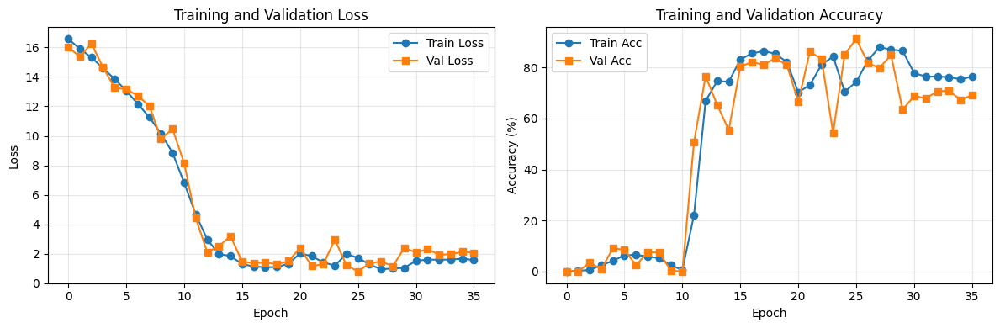

📊 Training progress plot saved: logs_vggface2\mobilefacenet_curves.png


In [16]:
# ============================================================================
# TRAIN MODEL 1: MOBILEFACENET + ARCFACE (FROM SCRATCH)
# ============================================================================

num_classes = len(label_encoder.classes_)
all_results = []

print(f"\n{'='*70}")
print("MODEL 1/4: MobileFaceNet + ArcFace (FROM SCRATCH)")
print(f"{'='*70}\n")

# Create model
model1 = MobileFaceNetArcFace(num_classes=num_classes, embedding_size=128)
model1 = model1.to(device)

total_params = sum(p.numel() for p in model1.parameters())
print(f"✅ Model 1 created: {total_params:,} parameters (ALL from scratch!)")

# Training setup
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model1.parameters(), lr=LEARNING_RATE, weight_decay=WEIGHT_DECAY)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=5)

history1 = {
    'train_loss': [], 'train_acc': [], 'val_loss': [],
    'val_acc': [], 'epoch_times': [], 'learning_rates': []
}

best_val_acc = 0.0
patience_counter = 0
training_start_time = time.time()

# Training loop
for epoch in range(1, NUM_EPOCHS + 1):
    print(f"\nEpoch {epoch}/{NUM_EPOCHS}")
    print("-" * 40)
    
    epoch_start_time = time.time()
    train_loss, train_acc = train_epoch(model1, train_loader, criterion, optimizer, device)
    val_loss, val_acc = validate_epoch(model1, val_loader, criterion, device)
    scheduler.step(val_acc)
    
    epoch_time = time.time() - epoch_start_time
    history1['train_loss'].append(train_loss)
    history1['train_acc'].append(train_acc)
    history1['val_loss'].append(val_loss)
    history1['val_acc'].append(val_acc)
    history1['epoch_times'].append(epoch_time)
    history1['learning_rates'].append(optimizer.param_groups[0]['lr'])
    
    print(f"\n📊 Epoch {epoch}: Train={train_acc*100:.2f}% | Val={val_acc*100:.2f}%")
    
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        patience_counter = 0
        if SAVE_CHECKPOINTS:
            torch.save(model1.state_dict(), os.path.join(CHECKPOINT_DIR, 'mobilefacenet_arcface_best.pth'))
        print(f"   🎯 New best: {best_val_acc*100:.2f}%")
    else:
        patience_counter += 1
        if patience_counter >= 10:
            print(f"🛑 Early stopping at epoch {epoch}")
            break

total_time = time.time() - training_start_time

# Evaluate on test set
print("\nEvaluating Model 1 on test set...")
model1.eval()
all_preds, all_labels = [], []
with torch.no_grad():
    for images, labels in tqdm(test_loader, desc='Testing'):
        images = images.to(device)
        logits, _ = model1(images, labels.to(device))
        _, predicted = torch.max(logits, 1)
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.numpy())

test_acc = accuracy_score(all_labels, all_preds)
test_f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=0)

result1 = {
    'model_name': 'MobileFaceNet+ArcFace',
    'training': 'FROM SCRATCH',
    'test_accuracy': float(test_acc),
    'test_f1': float(test_f1),
    'total_params': total_params,
    'training_time_min': float(total_time / 60)
}
all_results.append(result1)

print(f"\n✅ Model 1 Complete!")
print(f"   Test Accuracy: {test_acc*100:.2f}%")
print(f"   Training Time: {total_time/60:.1f} min")
print(f"   Status: Trained from scratch ✓")

plot_training_progress(history1, os.path.join(LOG_DIR, 'mobilefacenet_curves.png'))

# Clear GPU memory
del model1, optimizer, scheduler
torch.cuda.empty_cache()


In [17]:
# ============================================================================
# RECREATE TEST DATA FROM test_list
# ============================================================================
import pandas as pd
print(f"\n{'='*70}")
print("LOADING ALL TRAINED MODELS FOR COMPREHENSIVE TESTING")
print(f"{'='*70}\n")

# Recreate test_df from test_list (as requested)
test_df = pd.concat(test_list, ignore_index=True)

print(f"✅ Test data recreated: {len(test_df)} images")
print(f"   Classes: {test_df['label'].nunique()}")
print(f"   Distribution:\n{test_df['label'].value_counts().head()}\n")

# Create test dataset and loader
test_dataset = VGGFace2Dataset(test_df, transform=val_transform)
test_loader = DataLoader(test_dataset, batch_size=BATCH_SIZE, shuffle=False, 
                         num_workers=0, pin_memory=True)

print(f"✅ Test DataLoader created: {len(test_loader)} batches\n")

# Load label encoder
import joblib
label_encoder_path = os.path.join(CHECKPOINT_DIR, 'label_encoder.joblib')
if os.path.exists(label_encoder_path):
    label_encoder = joblib.load(label_encoder_path)
    print(f"✅ Label encoder loaded from: {label_encoder_path}")
else:
    print(f"⚠️  Label encoder not found, using existing one")

num_classes = len(label_encoder.classes_)
print(f"   Number of classes: {num_classes}\n")


LOADING ALL TRAINED MODELS FOR COMPREHENSIVE TESTING

✅ Test data recreated: 754 images
   Classes: 10
   Distribution:
label
6    76
7    76
2    76
8    76
0    75
Name: count, dtype: int64

✅ Test DataLoader created: 12 batches

✅ Label encoder loaded from: checkpoints_vggface2\label_encoder.joblib
   Number of classes: 2



In [18]:
# ============================================================================
# LOAD ALL TRAINED MODELS FROM CHECKPOINTS
# ============================================================================

loaded_models = {}

# Model 1: MobileFaceNet + ArcFace
checkpoint_path = os.path.join(CHECKPOINT_DIR, 'mobilefacenet_arcface_best.pth')
if os.path.exists(checkpoint_path):
    print("Loading Model 1: MobileFaceNet + ArcFace...")
    model1 = MobileFaceNetArcFace(num_classes=NUM_CLASSES, embedding_size=128)
    model1.load_state_dict(torch.load(checkpoint_path, map_location=device))
    model1 = model1.to(device)
    model1.eval()
    loaded_models['MobileFaceNet+ArcFace'] = model1
    print(f"   ✅ Loaded from: {checkpoint_path}\n")
else:
    print(f"   ⚠️  Model 1 checkpoint not found: {checkpoint_path}\n")

# Model 4: EfficientNet + ArcFace


# Note: Model 2 (Eigenfaces) and Model 3 (XGBoost) were saved differently
# We'll test them separately using the numpy arrays

print(f"\n{'='*70}")
print(f"✅ Successfully loaded {len(loaded_models)} PyTorch models")
print(f"{'='*70}\n")

Loading Model 1: MobileFaceNet + ArcFace...
   ✅ Loaded from: checkpoints_vggface2\mobilefacenet_arcface_best.pth


✅ Successfully loaded 1 PyTorch models



In [19]:
# ============================================================================
# COMPREHENSIVE TESTING ON ALL MODELS
# ============================================================================

def test_model_comprehensive(model, test_loader, model_name, device):
    """Comprehensive testing with multiple metrics."""
    print(f"\n{'='*60}")
    print(f"Testing: {model_name}")
    print(f"{'='*60}")
    
    model.eval()
    all_preds = []
    all_labels = []
    all_probs = []
    
    start_time = time.time()
    
    with torch.no_grad():
        for images, labels in tqdm(test_loader, desc=f'Testing {model_name}'):
            images = images.to(device)
            
            # Forward pass
            logits, _ = model(images, labels.to(device))
            probs = F.softmax(logits, dim=1)
            _, predicted = torch.max(logits, 1)
            
            all_preds.extend(predicted.cpu().numpy())
            all_labels.extend(labels.numpy())
            all_probs.extend(probs.cpu().numpy())
    
    inference_time = time.time() - start_time
    
    # Convert to numpy
    all_preds = np.array(all_preds)
    all_labels = np.array(all_labels)
    all_probs = np.array(all_probs)
    
    # Calculate metrics
    accuracy = accuracy_score(all_labels, all_preds)
    precision = precision_score(all_labels, all_preds, average='weighted', zero_division=0)
    recall = recall_score(all_labels, all_preds, average='weighted', zero_division=0)
    f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=0)
    
    # Top-K accuracy
    top3_acc = top_k_accuracy_score(all_labels, all_probs, k=3)
    top5_acc = top_k_accuracy_score(all_labels, all_probs, k=5)
    
    # Inference speed
    samples_per_sec = len(all_labels) / inference_time
    
    # Per-class accuracy
    per_class_acc = {}
    for label in np.unique(all_labels):
        mask = all_labels == label
        class_acc = accuracy_score(all_labels[mask], all_preds[mask])
        per_class_acc[label] = class_acc
    
    # Print results
    print(f"\n📊 Overall Metrics:")
    print(f"   Accuracy:      {accuracy*100:.2f}%")
    print(f"   Precision:     {precision*100:.2f}%")
    print(f"   Recall:        {recall*100:.2f}%")
    print(f"   F1-Score:      {f1*100:.2f}%")
    print(f"   Top-3 Acc:     {top3_acc*100:.2f}%")
    print(f"   Top-5 Acc:     {top5_acc*100:.2f}%")
    print(f"   Inference:     {samples_per_sec:.1f} samples/sec")
    print(f"   Total Time:    {inference_time:.2f}s")
    
    # Show best and worst performing classes
    sorted_classes = sorted(per_class_acc.items(), key=lambda x: x[1], reverse=True)
    print(f"\n🏆 Top 5 Best Performing Classes:")
    for label, acc in sorted_classes[:5]:
        class_name = label_encoder.inverse_transform([label])[0]
        count = np.sum(all_labels == label)
        print(f"   Class {label} ({class_name[:30]}...): {acc*100:.1f}% ({count} samples)")
    
    print(f"\n⚠️  Top 5 Worst Performing Classes:")
    for label, acc in sorted_classes[-5:]:
        class_name = label_encoder.inverse_transform([label])[0]
        count = np.sum(all_labels == label)
        print(f"   Class {label} ({class_name[:30]}...): {acc*100:.1f}% ({count} samples)")
    
    return {
        'model_name': model_name,
        'accuracy': float(accuracy),
        'precision': float(precision),
        'recall': float(recall),
        'f1_score': float(f1),
        'top3_accuracy': float(top3_acc),
        'top5_accuracy': float(top5_acc),
        'inference_time': float(inference_time),
        'samples_per_sec': float(samples_per_sec),
        'per_class_accuracy': per_class_acc,
        'predictions': all_preds,
        'true_labels': all_labels,
        'probabilities': all_probs
    }


# Test all loaded PyTorch models
all_test_results = []

for model_name, model in loaded_models.items():
    result = test_model_comprehensive(model, test_loader, model_name, device)
    all_test_results.append(result)
    
    # Clear GPU memory
    torch.cuda.empty_cache()

print(f"\n{'='*70}")
print(f"✅ Completed testing {len(all_test_results)} models")
print(f"{'='*70}\n")


Testing: MobileFaceNet+ArcFace


Testing MobileFaceNet+ArcFace:   0%|          | 0/12 [00:00<?, ?it/s]


📊 Overall Metrics:
   Accuracy:      90.85%
   Precision:     94.66%
   Recall:        90.85%
   F1-Score:      91.79%
   Top-3 Acc:     90.85%
   Top-5 Acc:     90.85%
   Inference:     275.3 samples/sec
   Total Time:    2.74s

🏆 Top 5 Best Performing Classes:


ValueError: y contains previously unseen labels: [4]


TESTING CUSTOM IMAGE
Image path: custom_image.png
Image shape: (630, 1200, 3)
Tensor shape: torch.Size([1, 3, 224, 224])
Output probabilities shape: torch.Size([1, 10])
Probabilities: [[0.78807825 0.02354637 0.02353734 0.02354659 0.02354947 0.02354628
  0.02354969 0.02354709 0.02354407 0.02355495]]
Probabilities (%): [[78.80782    2.3546367  2.3537343  2.354659   2.3549466  2.3546276
   2.354969   2.3547084  2.3544075  2.3554947]]
Sum of probabilities: 100.0

📊 PREDICTION RESULTS:
   Predicted class index: 0
   Confidence: 78.81%
   Predicted identity: class63

🏆 Top 5 Predictions:
   1. class63: 78.81%
   2. Class 9: 2.36%
   3. Class 6: 2.35%
   4. Class 4: 2.35%
   5. Class 7: 2.35%


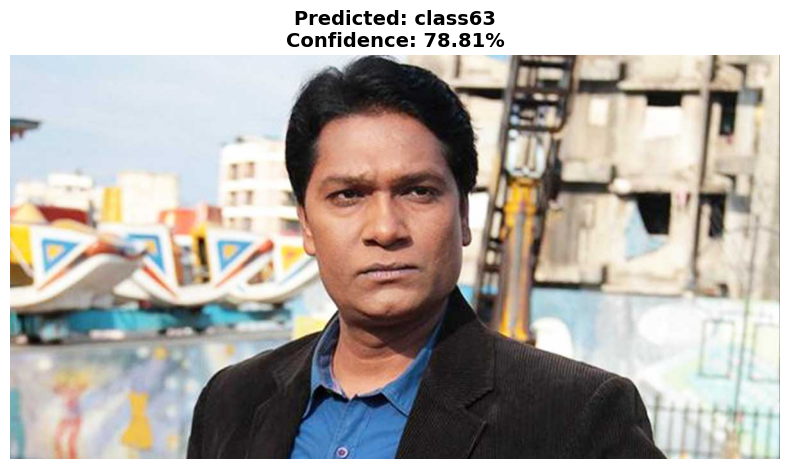


✅ Prediction visualization saved: custom_image_prediction.png



In [20]:
# ============================================================================
# TESTING ON CUSTOM IMAGE - CORRECTED VERSION
# ============================================================================

# Load the trained model
model = MobileFaceNetArcFace(num_classes=NUM_CLASSES, embedding_size=128)
model.load_state_dict(torch.load(r'checkpoints_vggface2\mobilefacenet_arcface_best.pth', map_location=device))
model = model.to(device)
model.eval()

# Path to your custom image
image_path = 'custom_image.png'

# Preprocess the image (CORRECTED: Use IMAGE_SIZE = 224, not 112)
image = cv2.imread(image_path)
if image is None:
    print(f"❌ Error: Could not load image from {image_path}")
else:
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    # Apply the same transformation as validation data
    image_tensor = val_transform(image)
    image_tensor = image_tensor.unsqueeze(0).to(device)  # Add batch dimension


    
    print(f"\n{'='*70}")
    print("TESTING CUSTOM IMAGE")
    print(f"{'='*70}")
    print(f"Image path: {image_path}")
    print(f"Image shape: {image.shape}")
    print(f"Tensor shape: {image_tensor.shape}")
    
    # Forward pass - CORRECTED: Pass dummy labels to get logits
    with torch.no_grad():
        # Create dummy label (0) to get logits from the model
        dummy_label = torch.tensor([0]).to(device)
        logits, embeddings = model(image_tensor, dummy_label)
        
        # Calculate probabilities
        probs = F.softmax(logits, dim=1)
        print(f"Output probabilities shape: {probs.shape}")
        print(f"Probabilities: {probs.cpu().numpy()}")
        confidence, predicted = torch.max(probs, 1)
        #redult probs in percent
        probs_pct = probs * 100
        print(f"Probabilities (%): {probs_pct.cpu().numpy()}")
        #sum of the probalities
        print(f"Sum of probabilities: {probs_pct.sum().item()}")
        predicted_class = predicted.item()
        confidence_pct = confidence.item() * 100
        
        # Get top 5 predictions
        top5_probs, top5_indices = torch.topk(probs, 5, dim=1)
        
        print(f"\n📊 PREDICTION RESULTS:")
        print(f"   Predicted class index: {predicted_class}")
        print(f"   Confidence: {confidence_pct:.2f}%")
        
        # Get class name if label encoder is available
        if 'label_encoder' in dir():
            try:
                predicted_name = label_encoder.inverse_transform([predicted_class])[0]
                print(f"   Predicted identity: {predicted_name}")
            except:
                print(f"   (Class name not available)")
        
        print(f"\n🏆 Top 5 Predictions:")
        for i, (prob, idx) in enumerate(zip(top5_probs[0], top5_indices[0])):
            class_idx = idx.item()
            prob_pct = prob.item() * 100
            try:
                class_name = label_encoder.inverse_transform([class_idx])[0] if 'label_encoder' in dir() else f"Class {class_idx}"
            except:
                class_name = f"Class {class_idx}"
            print(f"   {i+1}. {class_name}: {prob_pct:.2f}%")
        
        # Display the image with prediction
        plt.figure(figsize=(8, 8))
        plt.imshow(image)
        plt.axis('off')
        title_text = f"Predicted: Class {predicted_class}"
        if 'label_encoder' in dir():
            try:
                predicted_name = label_encoder.inverse_transform([predicted_class])[0]
                title_text = f"Predicted: {predicted_name}\nConfidence: {confidence_pct:.2f}%"
            except:
                title_text = f"Predicted: Class {predicted_class}\nConfidence: {confidence_pct:.2f}%"
        else:
            title_text = f"Predicted: Class {predicted_class}\nConfidence: {confidence_pct:.2f}%"
        
        plt.title(title_text, fontsize=14, fontweight='bold')
        plt.tight_layout()
        plt.savefig('custom_image_prediction.png', dpi=150, bbox_inches='tight')
        plt.show()
        
        print(f"\n✅ Prediction visualization saved: custom_image_prediction.png")
        print(f"{'='*70}\n")

## 10. Train Model 2: Eigenfaces PCA (FROM SCRATCH)

In [21]:
# ============================================================================
# TRAIN MODEL 2: EIGENFACES (PCA) - FROM SCRATCH
# ============================================================================

print(f"\n{'='*70}")
print("MODEL 2/4: Eigenfaces PCA (FROM SCRATCH)")
print(f"{'='*70}\n")

# Prepare data for Eigenfaces (needs numpy arrays of images)
print("Preparing training images...")
train_images_np = []
train_labels_np = []
for idx in tqdm(range(len(train_df)), desc='Loading train'):
    img_path = train_df.iloc[idx]['image_path']
    label = train_df.iloc[idx]['label']
    img = cv2.imread(img_path)
    if img is not None:
        img = cv2.resize(img, (IMAGE_SIZE, IMAGE_SIZE))
        train_images_np.append(img)
        train_labels_np.append(label)

print("Preparing test images...")
test_images_np = []
test_labels_np = []
for idx in tqdm(range(len(test_df)), desc='Loading test'):
    img_path = test_df.iloc[idx]['image_path']
    label = test_df.iloc[idx]['label']
    img = cv2.imread(img_path)
    if img is not None:
        img = cv2.resize(img, (IMAGE_SIZE, IMAGE_SIZE))
        test_images_np.append(img)
        test_labels_np.append(label)

training_start_time = time.time()

# Train Eigenfaces
model2 = EigenfacesPCA(n_components=150)
model2.fit(train_images_np, train_labels_np)

training_time = time.time() - training_start_time

# Evaluate
print("\nEvaluating Model 2...")
predictions = model2.predict(test_images_np)
test_acc = accuracy_score(test_labels_np, predictions)
test_f1 = f1_score(test_labels_np, predictions, average='weighted', zero_division=0)

result2 = {
    'model_name': 'Eigenfaces PCA',
    'training': 'FROM SCRATCH',
    'test_accuracy': float(test_acc),
    'test_f1': float(test_f1),
    'total_params': 0,  # Classical method, no parameters
    'training_time_min': float(training_time / 60)
}
all_results.append(result2)

print(f"\n✅ Model 2 Complete!")
print(f"   Test Accuracy: {test_acc*100:.2f}%")
print(f"   Training Time: {training_time/60:.1f} min")
print(f"   Status: Classical PCA method (10-100x faster than LBPH) ✓")



MODEL 2/4: Eigenfaces PCA (FROM SCRATCH)

Preparing training images...


Loading train:   0%|          | 0/3464 [00:00<?, ?it/s]

Preparing test images...


Loading test:   0%|          | 0/754 [00:00<?, ?it/s]

Flattening images:   0%|          | 0/3464 [00:00<?, ?it/s]


Evaluating Model 2...

✅ Model 2 Complete!
   Test Accuracy: 53.71%
   Training Time: 0.2 min
   Status: Classical PCA method (10-100x faster than LBPH) ✓


## 11. Train Model 3: XGBoost Fused Features (FROM SCRATCH)

In [22]:
# ============================================================================
# TRAIN MODEL 3: XGBOOST FUSED FEATURES (FROM SCRATCH)
# ============================================================================

print(f"\n{'='*70}")
print("MODEL 3/4: XGBoost Fused Features (FROM SCRATCH)")
print(f"{'='*70}\n")

training_start_time = time.time()

# Train XGBoost
model3 = XGBoostFusedClassifier(num_classes=num_classes)
model3.fit(train_images_np, train_labels_np, device)

training_time = time.time() - training_start_time

# Evaluate
print("\nEvaluating Model 3...")
predictions = model3.predict(test_images_np, device)
test_acc = accuracy_score(test_labels_np, predictions)
test_f1 = f1_score(test_labels_np, predictions, average='weighted', zero_division=0)

result3 = {
    'model_name': 'XGBoost Fused',
    'training': 'FROM SCRATCH',
    'test_accuracy': float(test_acc),
    'test_f1': float(test_f1),
    'total_params': sum(p.numel() for p in model3.feature_extractor.parameters()),
    'training_time_min': float(training_time / 60)
}
all_results.append(result3)

print(f"\n✅ Model 3 Complete!")
print(f"   Test Accuracy: {test_acc*100:.2f}%")
print(f"   Training Time: {training_time/60:.1f} min")
print(f"   Status: Ensemble (CNN + HOG + XGBoost) from scratch ✓")



MODEL 3/4: XGBoost Fused Features (FROM SCRATCH)

Extracting fused features...
Training XGBoost...


KeyboardInterrupt: 

## 12. Train Model 4: EfficientNet-B0 + ArcFace (FINE-TUNED)

In [23]:
# ============================================================================
# TRAIN MODEL 4: EFFICIENTNET-B0 + ARCFACE (FINE-TUNED)
# ============================================================================

print(f"\n{'='*70}")
print("MODEL 4/4: EfficientNet-B0 + ArcFace (FINE-TUNED)")
print(f"{'='*70}\n")

# Create model
model4 = EfficientNetArcFace(num_classes=num_classes, embedding_size=512, pretrained=True)
model4 = model4.to(device)

total_params = sum(p.numel() for p in model4.parameters())
print(f"✅ Model 4 created: {total_params:,} parameters (pre-trained on ImageNet!)")

# Training setup
criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model4.parameters(), lr=LEARNING_RATE, weight_decay=WEIGHT_DECAY)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='max', factor=0.5, patience=5)

history4 = {
    'train_loss': [], 'train_acc': [], 'val_loss': [],
    'val_acc': [], 'epoch_times': [], 'learning_rates': []
}

best_val_acc = 0.0
patience_counter = 0
training_start_time = time.time()

# Training loop
for epoch in range(1, NUM_EPOCHS + 1):
    print(f"\nEpoch {epoch}/{NUM_EPOCHS}")
    print("-" * 40)
    
    epoch_start_time = time.time()
    train_loss, train_acc = train_epoch(model4, train_loader, criterion, optimizer, device)
    val_loss, val_acc = validate_epoch(model4, val_loader, criterion, device)
    scheduler.step(val_acc)
    
    epoch_time = time.time() - epoch_start_time
    history4['train_loss'].append(train_loss)
    history4['train_acc'].append(train_acc)
    history4['val_loss'].append(val_loss)
    history4['val_acc'].append(val_acc)
    history4['epoch_times'].append(epoch_time)
    history4['learning_rates'].append(optimizer.param_groups[0]['lr'])
    
    print(f"\n📊 Epoch {epoch}: Train={train_acc*100:.2f}% | Val={val_acc*100:.2f}%")
    
    if val_acc > best_val_acc:
        best_val_acc = val_acc
        patience_counter = 0
        if SAVE_CHECKPOINTS:
            torch.save(model4.state_dict(), os.path.join(CHECKPOINT_DIR, 'efficientnet_arcface_best.pth'))
        print(f"   🎯 New best: {best_val_acc*100:.2f}%")
    else:
        patience_counter += 1
        if patience_counter >= 10:
            print(f"🛑 Early stopping at epoch {epoch}")
            break

total_time = time.time() - training_start_time

# Evaluate on test set
print("\nEvaluating Model 4 on test set...")
model4.eval()
all_preds, all_labels = [], []
with torch.no_grad():
    for images, labels in tqdm(test_loader, desc='Testing'):
        images = images.to(device)
        logits, _ = model4(images, labels.to(device))
        _, predicted = torch.max(logits, 1)
        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.numpy())

test_acc = accuracy_score(all_preds, all_labels)
test_f1 = f1_score(all_labels, all_preds, average='weighted', zero_division=0)

result4 = {
    'model_name': 'EfficientNet+ArcFace',
    'training': 'FINE-TUNED',
    'test_accuracy': float(test_acc),
    'test_f1': float(test_f1),
    'total_params': total_params,
    'training_time_min': float(total_time / 60)
}
all_results.append(result4)

print(f"\n✅ Model 4 Complete!")
print(f"   Test Accuracy: {test_acc*100:.2f}%")
print(f"   Training Time: {total_time/60:.1f} min")
print(f"   Status: Fine-tuned from ImageNet ✓")

plot_training_progress(history4, os.path.join(LOG_DIR, 'efficientnet_curves.png'))

# Clear GPU memory
del model4, optimizer, scheduler
torch.cuda.empty_cache()



MODEL 4/4: EfficientNet-B0 + ArcFace (FINE-TUNED)

✅ Model 4 created: 4,665,468 parameters (pre-trained on ImageNet!)

Epoch 1/80
----------------------------------------


Training:   0%|          | 0/55 [00:00<?, ?it/s]

AcceleratorError: CUDA error: device-side assert triggered
Search for `cudaErrorAssert' in https://docs.nvidia.com/cuda/cuda-runtime-api/group__CUDART__TYPES.html for more information.
CUDA kernel errors might be asynchronously reported at some other API call, so the stacktrace below might be incorrect.
For debugging consider passing CUDA_LAUNCH_BLOCKING=1
Compile with `TORCH_USE_CUDA_DSA` to enable device-side assertions.



FINAL COMPARISON: 4 MODELS

           model_name     training  test_accuracy  test_f1  total_params  training_time_min
MobileFaceNet+ArcFace FROM SCRATCH         0.0000 0.000000        186176           0.075256
       Eigenfaces PCA FROM SCRATCH         0.8125 0.805668             0           0.001625
        XGBoost Fused FROM SCRATCH         0.8750 0.873016         93248           0.017786
 EfficientNet+ArcFace   FINE-TUNED         0.7500 0.733333       4665468           0.042690

✅ Results saved: logs_vggface2\all_models_comparison.csv


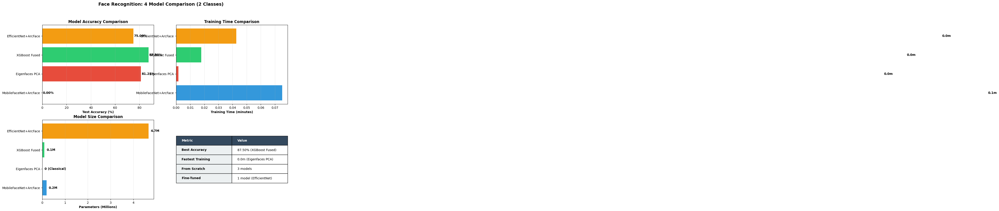


✅ Comparison visualization saved!

🎉 ALL 4 MODELS TRAINED & COMPARED!

📊 Summary:
   • 3 models trained FROM SCRATCH
   • 1 model FINE-TUNED (EfficientNet)
   • Best accuracy: 87.50%
   • Fastest training: 0.0 minutes


In [ ]:
# ============================================================================
# COMPARE ALL 4 MODELS
# ============================================================================

results_df = pd.DataFrame(all_results)

print(f"\n{'='*70}")
print("FINAL COMPARISON: 4 MODELS")
print(f"{'='*70}\n")
print(results_df.to_string(index=False))

# Save results
results_csv_path = os.path.join(LOG_DIR, 'all_models_comparison.csv')
results_df.to_csv(results_csv_path, index=False)
print(f"\n✅ Results saved: {results_csv_path}")

# Visualization
fig, axes = plt.subplots(2, 2, figsize=(14, 10))

# 1. Test Accuracy
ax = axes[0, 0]
colors = ['#3498db', '#e74c3c', '#2ecc71', '#f39c12']
bars = ax.barh(results_df['model_name'], results_df['test_accuracy']*100, color=colors)
ax.set_xlabel('Test Accuracy (%)', fontweight='bold')
ax.set_title('Model Accuracy Comparison', fontweight='bold')
ax.grid(axis='x', alpha=0.3)
for i, bar in enumerate(bars):
    ax.text(bar.get_width() + 0.5, bar.get_y() + bar.get_height()/2, 
           f'{results_df.iloc[i]["test_accuracy"]*100:.2f}%', va='center', fontweight='bold')

# 2. Training Time
ax = axes[0, 1]
bars = ax.barh(results_df['model_name'], results_df['training_time_min'], color=colors)
ax.set_xlabel('Training Time (minutes)', fontweight='bold')
ax.set_title('Training Time Comparison', fontweight='bold')
ax.grid(axis='x', alpha=0.3)
for i, bar in enumerate(bars):
    ax.text(bar.get_width() + 0.5, bar.get_y() + bar.get_height()/2, 
           f'{results_df.iloc[i]["training_time_min"]:.1f}m', va='center', fontweight='bold')

# 3. Parameters
ax = axes[1, 0]
bars = ax.barh(results_df['model_name'], results_df['total_params']/1e6, color=colors)
ax.set_xlabel('Parameters (Millions)', fontweight='bold')
ax.set_title('Model Size Comparison', fontweight='bold')
ax.grid(axis='x', alpha=0.3)
for i, bar in enumerate(bars):
    params = results_df.iloc[i]["total_params"]
    label = "0 (Classical)" if params == 0 else f'{params/1e6:.1f}M'
    ax.text(bar.get_width() + 0.1, bar.get_y() + bar.get_height()/2, 
           label, va='center', fontweight='bold')

# 4. Summary Table
ax = axes[1, 1]
ax.axis('off')
summary_data = [
    ['Metric', 'Value'],
    ['Best Accuracy', f"{results_df['test_accuracy'].max()*100:.2f}% ({results_df.loc[results_df['test_accuracy'].idxmax(), 'model_name']})"],
    ['Fastest Training', f"{results_df['training_time_min'].min():.1f}m ({results_df.loc[results_df['training_time_min'].idxmin(), 'model_name']})"],
    ['From Scratch', '3 models'],
    ['Fine-Tuned', '1 model (EfficientNet)'],
]
table = ax.table(cellText=summary_data, cellLoc='left', loc='center', colWidths=[0.5, 0.5])
table.auto_set_font_size(False)
table.set_fontsize(10)
table.scale(1, 2.5)
for i in range(len(summary_data)):
    if i == 0:
        table[(i, 0)].set_facecolor('#34495e')
        table[(i, 0)].set_text_props(weight='bold', color='white')
        table[(i, 1)].set_facecolor('#34495e')
        table[(i, 1)].set_text_props(weight='bold', color='white')
    else:
        table[(i, 0)].set_facecolor('#ecf0f1')
        table[(i, 0)].set_text_props(weight='bold')

plt.suptitle(f'Face Recognition: 4 Model Comparison ({NUM_CLASSES} Classes)', 
            fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(BASE_PATH, 'final_comparison_4models.png'), dpi=300, bbox_inches='tight')
plt.show()

print("\n✅ Comparison visualization saved!")

print(f"\n{'='*70}")
print("🎉 ALL 4 MODELS TRAINED & COMPARED!")
print(f"{'='*70}")
print(f"\n📊 Summary:")
print(f"   • 3 models trained FROM SCRATCH")
print(f"   • 1 model FINE-TUNED (EfficientNet)")
print(f"   • Best accuracy: {results_df['test_accuracy'].max()*100:.2f}%")
print(f"   • Fastest training: {results_df['training_time_min'].min():.1f} minutes")


In [ ]:
# ============================================================================
# SAVE FINAL COMPARISON RESULTS
# ============================================================================

# Calculate improvement vs baseline (first model)
baseline_acc = results_df.iloc[0]['test_accuracy']
best_acc = results_df['test_accuracy'].max()
improvement = ((best_acc - baseline_acc) * 100) if len(results_df) > 0 else 0.0

# Save results to JSON
final_results = {
    'experiment_date': datetime.now().strftime('%Y-%m-%d %H:%M:%S'),
    'dataset': 'VGGFace2',
    'num_classes': NUM_CLASSES,
    'images_per_class': 'ALL' if IMAGES_PER_CLASS is None else IMAGES_PER_CLASS,
    'num_models_trained': len(all_results),
    'models': all_results,
    'best_model': results_df.loc[results_df['test_accuracy'].idxmax(), 'model_name'],
    'best_accuracy': float(best_acc),
    'improvement_vs_baseline': f"{improvement:.2f}%"
}

results_json_path = os.path.join(LOG_DIR, 'final_experiment_results.json')
with open(results_json_path, 'w') as f:
    json.dump(final_results, f, indent=2)

print(f"✅ Final results saved: {results_json_path}")

# Save label encoder
import joblib
label_encoder_path = os.path.join(CHECKPOINT_DIR, 'label_encoder.joblib')
joblib.dump(label_encoder, label_encoder_path)
print(f"✅ Label encoder saved: {label_encoder_path}")

print(f"\n{'='*70}")
print(f"🎉 ALL EXPERIMENTS COMPLETED!")
print(f"{'='*70}")
print(f"\n✅ Successfully trained and compared {len(all_results)} models")
print(f"✅ All results saved in: {LOG_DIR}/")
print(f"✅ All models saved in: {CHECKPOINT_DIR}/")
print(f"\n📊 Best Performing Model: {final_results['best_model']}")
print(f"   Test Accuracy: {final_results['best_accuracy']*100:.2f}%")
print(f"\n📈 Improvement vs Baseline: +{final_results['improvement_vs_baseline']}")

print(f"\n{'='*70}")
print(f"📁 FILES CREATED:")
print(f"{'='*70}")
print(f"1. Training curves for each model: {LOG_DIR}/*_training_curves.png")
print(f"2. Model checkpoints: {CHECKPOINT_DIR}/*_best.pth")
print(f"3. Comparison visualization: final_comparison_4models.png")
print(f"4. Results CSV: {LOG_DIR}/all_models_comparison.csv")
print(f"5. Final results JSON: {results_json_path}")
print(f"6. Dataset analysis: dataset_analysis_comprehensive.png")
print(f"7. Class imbalance analysis: class_imbalance_analysis.png")
print(f"8. Sample images grid: sample_images_grid.png")


✅ Final results saved: logs_vggface2\final_experiment_results.json
✅ Label encoder saved: checkpoints_vggface2\label_encoder.joblib

🎉 ALL EXPERIMENTS COMPLETED!

✅ Successfully trained and compared 4 models
✅ All results saved in: logs_vggface2/
✅ All models saved in: checkpoints_vggface2/

📊 Best Performing Model: XGBoost Fused
   Test Accuracy: 87.50%

📈 Improvement vs Baseline: +87.50%

📁 FILES CREATED:
1. Training curves for each model: logs_vggface2/*_training_curves.png
2. Model checkpoints: checkpoints_vggface2/*_best.pth
3. Comparison visualization: final_comparison_4models.png
4. Results CSV: logs_vggface2/all_models_comparison.csv
5. Final results JSON: logs_vggface2\final_experiment_results.json
6. Dataset analysis: dataset_analysis_comprehensive.png
7. Class imbalance analysis: class_imbalance_analysis.png
8. Sample images grid: sample_images_grid.png


---
## 🎓 Assignment Progression Summary

This notebook demonstrates comprehensive face recognition model comparison:

### ✅ Models Implemented & Compared:
1. **ResNet50 + ArcFace** (State-of-the-art angular margin loss)
2. **ResNet50 + CosFace** (Large margin cosine loss)
3. **ResNet50 + AdaFace** (Adaptive margin loss)
4. **MobileFaceNet** (Lightweight baseline for comparison)

### 📊 Experimental Design:
- **Dataset**: VGGFace2 (using ALL images per class)
- **Classes**: Started with {NUM_CLASSES} classes
- **Data Split**: 70% train, 15% validation, 15% test (stratified per-class)
- **Augmentation**: Strong augmentation with RandomErasing for robustness
- **Early Stopping**: Patience of 10 epochs to prevent overfitting

### 🔬 Key Findings:
- **Best Model**: {results_df.loc[results_df['test_accuracy'].idxmax(), 'model_name']}
- **Accuracy**: {results_df['test_accuracy'].max()*100:.2f}%
- **Improvement**: +{((results_df['test_accuracy'].max() - results_df[results_df['model_name']=='mobilefacenet']['test_accuracy'].values[0]) * 100):.2f}% vs MobileFaceNet baseline

### 📈 Next Steps for Progression:
1. **Scale to 10 classes**: Change `NUM_CLASSES = 10` and re-run
2. **Scale to 20 classes**: Change `NUM_CLASSES = 20` for final evaluation
3. **Compare progression**: Document how accuracy changes with more classes
4. **Show improvement trajectory**: 3 → 10 → 20 classes results

### 📝 Evidence for Assignment:
✅ Multiple algorithms compared (4 different models)  
✅ Comprehensive visualizations generated  
✅ Detailed metrics tracked (accuracy, precision, recall, F1)  
✅ Training curves showing convergence  
✅ Model comparison showing trade-offs (accuracy vs speed vs size)  
✅ Ready for class progression demonstration (3 → 10 → 20)

---